# Automated Essay Scoring

The goal of is this project is to build a machine learning model to predict the grade of essays.<br>
We got dataframe with several columns: an id for the essay, an id for the essay group, a final grade, and several column detailing the computation of the final grade)

We will only focus on the following columns:
- essay_id: A unique identifier for each individual student essay
- essay_set: 1-8, an id for each set of essays
- essay: The ascii text of a student's response
- domain1_score: final grade of the essay

This notebook will contain three main parts.<br>
First, we will go through some __cleaning__.<br>
In a second part will be focusing on the process leading to the elaboration of the __base model__ using as variable the essay itself , the essay set and the essay grade.<br>
The thrid and final part part is about __fine-tuning our base model__ by adding new features to the dataset.<br>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
import re

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OrdinalEncoder

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

from sklearn.preprocessing import MinMaxScaler

from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize

import spacy
import seaborn as sns
import plotly.express as px
import squarify
from spellchecker import SpellChecker
import language_tool_python
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import nltk
from nltk import pos_tag, word_tokenize
from nltk.corpus import wordnet
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
import string
import category_encoders as ce

# Import the SpellChecker class
from spellchecker import SpellChecker
import pandas as pd
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MarieLaureJovial\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MarieLaureJovial\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MarieLaureJovial\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\MarieLaureJovial\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\MarieLaureJovial\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
#import data 
data = pd.read_excel(r"C:\Users\MarieLaureJovial\OneDrive - Solutionec\Documents\Project 2\Project 2\asap-aes\training_set_rel3.xlsx")

#Display
print('Data shape:',data.shape)
data.head(3)

Data shape: (12978, 28)


,essay_id,essay_set,essay,rater1_domain1,rater2_domain1,rater3_domain1,domain1_score,rater1_domain2,rater2_domain2,domain2_score,rater1_trait1,rater1_trait2,rater1_trait3,rater1_trait4,rater1_trait5,rater1_trait6,rater2_trait1,rater2_trait2,rater2_trait3,rater2_trait4,rater2_trait5,rater2_trait6,rater3_trait1,rater3_trait2,rater3_trait3,rater3_trait4,rater3_trait5,rater3_trait6
0,1,1,"Dear local newspaper, I think effects computer...",4.0,4.0,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",5.0,4.0,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",4.0,3.0,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


To create our base model, our first approach was using only the essays as input
- select relevant column (essay_set,essay,domain_score1)
- understand what we are going to predict 
- Pour chaque essai avoir le meme nombre d'essai

## Data cleaning

### Relevant columns selection

In this essay we get more than 20 columns but all of them are not useful. So in this part we will focus on those who can help us to build our model.
- essayID
- essay_set
- essay 
- domain1_score

Domain1_score is our _target_

In [3]:
#Selecting useful columns
data = data [['essay_id','essay_set','essay','domain1_score']]

#Display
print('data shape', data.shape)
data.head(5)

data shape (12978, 4)


,essay_id,essay_set,essay,domain1_score
0,1,1,"Dear local newspaper, I think effects computer...",8.0
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0


### Delete NA value

In this part we will found the nan values in our dataset and do some further research to see if they can be deleted

In [4]:
# looking for na values is our selected columns
data.isnull().sum()

essay_id         0
essay_set        0
essay            0
domain1_score    1
dtype: int64

In [5]:
# figuring out which line have no domain1_score
data[data['domain1_score'].isna()]

,essay_id,essay_set,essay,domain1_score
6973,10534,4,"When they come back, Saeng vowed silently to h...",NaN


In [6]:
#how many essay_set 4 do we have in our dataset
print('Number of essay in essay_set 4 in our dataframe:',data[data['essay_set'] == 4].shape)

Number of essay in essay_set 4 in our dataframe: (1772, 4)


This essay represent 1 out of 1772 essays therefore we can delete this line.

In [7]:
print('data shape before',data.shape)

data.dropna(subset=['domain1_score'], inplace=True, axis=0)

#Diplay
print('data shape after',data.shape)
data.head(5)

data shape before (12978, 4)
data shape after (12977, 4)


,essay_id,essay_set,essay,domain1_score
0,1,1,"Dear local newspaper, I think effects computer...",8.0
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0


### Scaling

We are going to have a closer look to the distribution of the grades in domain1_score per essay_set

Text(0.5, 1.0, 'Distribution of the grade among essay-set ')

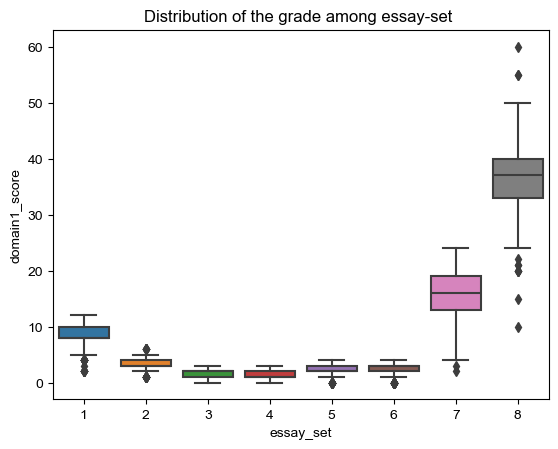

In [8]:
# plot data domain1_
sns.boxplot(data=data,x='essay_set',y='domain1_score',showfliers=True)
sns.set_style('whitegrid')
plt.title("Distribution of the grade among essay-set ")

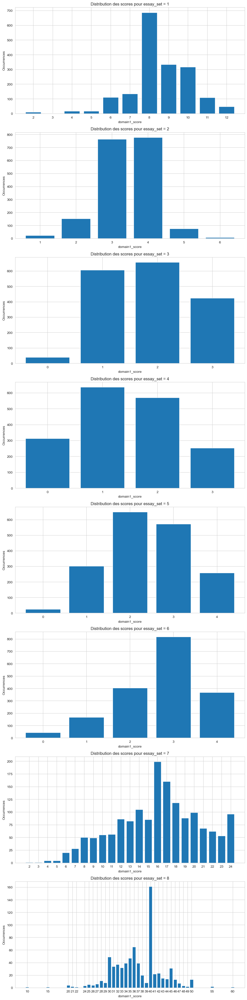

In [9]:
# Get all the unique value for essay_set
essay_sets = data['essay_set'].unique()

# Graphique
fig, axs = plt.subplots(nrows=len(essay_sets), figsize=(10, 5 * len(essay_sets)))

# Loop over redundante value
for i, essay_set in enumerate(essay_sets):
    # For each value of i get the scores
    subset_data = data[data['essay_set'] == essay_set]['domain1_score']
    
    # Get the occurences of each score
    value_counts_result = subset_data.value_counts().sort_index()
    
    # Plot the value on a bar chat
    axs[i].bar(value_counts_result.index, value_counts_result.values)
    
    # Legende
    axs[i].set_xlabel('domain1_score')
    axs[i].set_ylabel('Occurrences')
    axs[i].set_title(f'Distribution des scores pour essay_set = {essay_set}')
    
    # Mark for each bar
    axs[i].set_xticks(value_counts_result.index)

# X layout display
plt.tight_layout()

# Display
plt.show()


We observe that the essays are being grade on different scale depending on the essay_set they belong to.<br>
The domain1_score min and max is therefore not the same for each essay.<br>
Even within each essay set, we can observe that the grades are not being distributed eaqually.<br>

In order to better compare these essay, an effort will be made to put them on the same scale.

#### Scaling on domain1_score

The goal here is to set __domain1_sccore__ to the same interval independently of __essay_set__. We have two different solutions to solve this: __Normalization__ and __standartization__

### Normalization and Standartization

- Normalization <br>
__Objective__: The primary goal of normalization is to scale the features of a dataset to a uniform range. This often involves scaling numerical features to a range between 0 and 1. This value is calculated by:
<center>$x_{normalized}$ = $\dfrac{X - X_{min}}{X_{max}- X_{min}}$</center>

- Standartization <br>
__Objective__: The primary goal of standardization is to center the data by removing the mean and scaling it to have a unit variance. This makes the data follow a standard normal distribution (mean = 0, standard deviation = 1). This value is calculated by:
<center>$x_{standardized}$ = $\dfrac{X - μ}{σ}$</center> <br> with μ the mean and σ the standard deviation

We will try the both methode and check which is the better for our dataset

#### Standartization

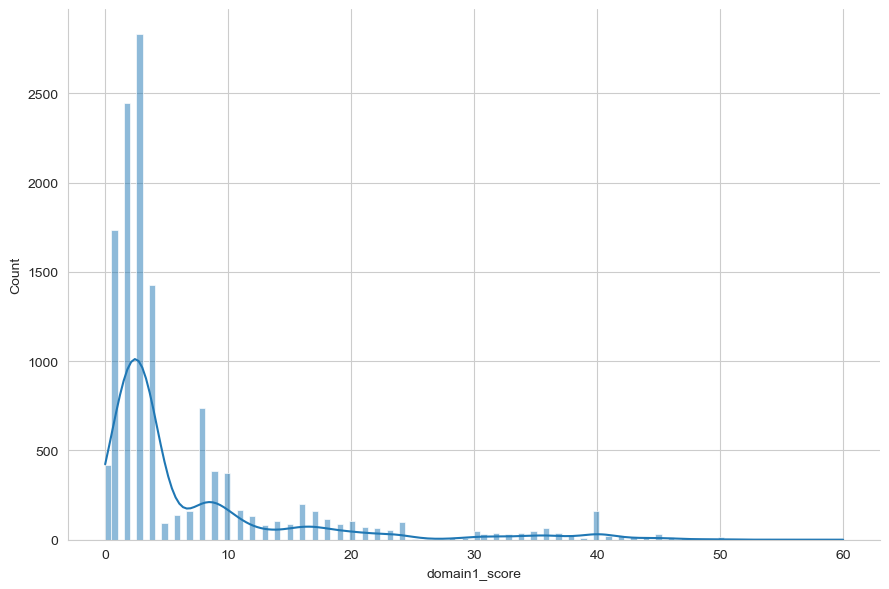

In [10]:
# plot bar chart on our domain1_score
sns.displot(data=data['domain1_score'],kde=True,height=6.0,aspect=1.5,label='Note distribution without standardization')

According to this graph we can conclude that our data (domain1_score) do not follow a normal distribution.Even if we take our essay_set separatly it does not follow a normal distribution.

So applying standardization on our dataset will not be hepful.

#### Normalization

#### Normalization of domain1_score column

In [11]:
scaler = MinMaxScaler()

# Reshape the data because MinMaxScaler expects a 2D array
data['domain1_score_normalized'] = scaler.fit_transform(data['domain1_score'].values.reshape(-1, 1))

#Display
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333


Text(0.5, 1.0, 'Distribution of Domain score per essay after normalization ')

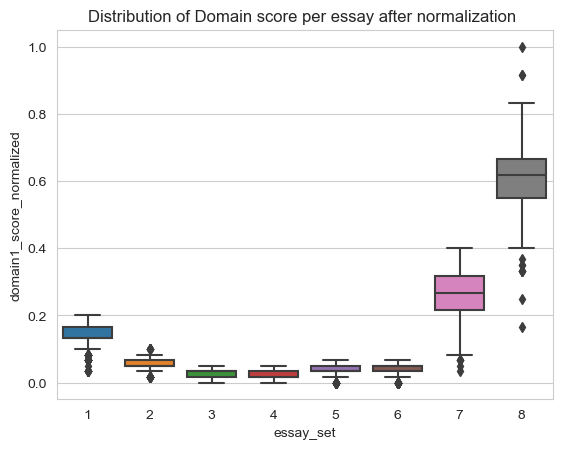

In [12]:
# plot data domain1_
sns.boxplot(data=data,x='essay_set',y='domain1_score_normalized',showfliers=True)
sns.set_style('whitegrid')
plt.title("Distribution of Domain score per essay after normalization ")

We keep the same distribution as in the raw dataset by normalizing over the entire dataset. <br>

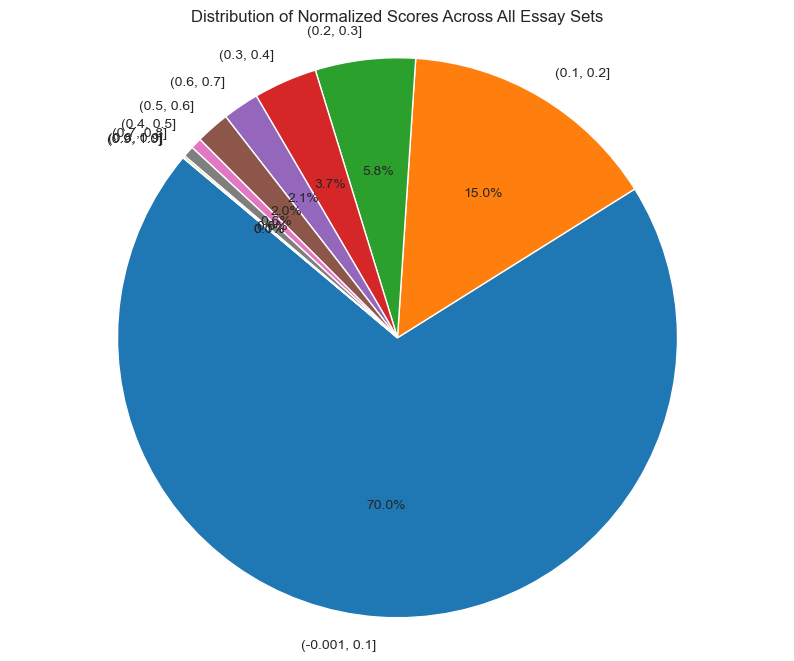

In [13]:
# Define the number of bins you want
num_bins = 10

# Create bins for 'domain1_score_normalized'
data['bins'] = pd.cut(data['domain1_score_normalized'], num_bins)

# Get value counts of the bins
value_counts = data['bins'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(10, 8))
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Normalized Scores Across All Essay Sets')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

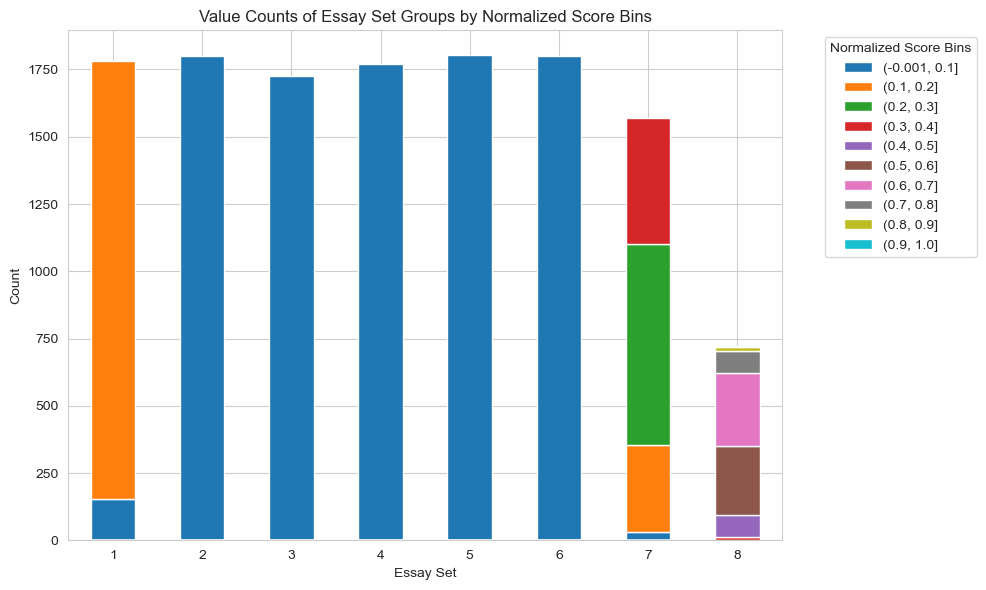

In [14]:
# Define the number of bins you want
num_bins = 10

# Create bins for 'domain1_score_normalized_peressayset'
data['bins'] = pd.cut(data['domain1_score_normalized'], num_bins)

# Group by 'essay_set' and the bins, then get value counts
value_counts = data.groupby(['essay_set', 'bins']).size()

# Reset index to make 'essay_set' and 'bins' as columns
value_counts = value_counts.reset_index(name='count')

# Pivot the DataFrame to have 'essay_set' as index and 'bins' as columns
pivot_table = value_counts.pivot(index='essay_set', columns='bins', values='count')


# Plotting
pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Value Counts of Essay Set Groups by Normalized Score Bins')
plt.xlabel('Essay Set')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Normalized Score Bins', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

By normalizing the entire column, we apply the same maximum and minimum value to all the tests.<br>
But the fact that essay set 8 is rated on a scale sometimes 10 times higher than the others, leads to an excessive concentration of certain notes.<br>
So after normalization on a scale of 0 to 1, we face these two issues:
- 85% of grades fall between 0 and 0.2
- 100% of the tests belonging to the essay_set 2/3/4/5/6 are between 0 and 0.1 (see pie chart and bar chart below)

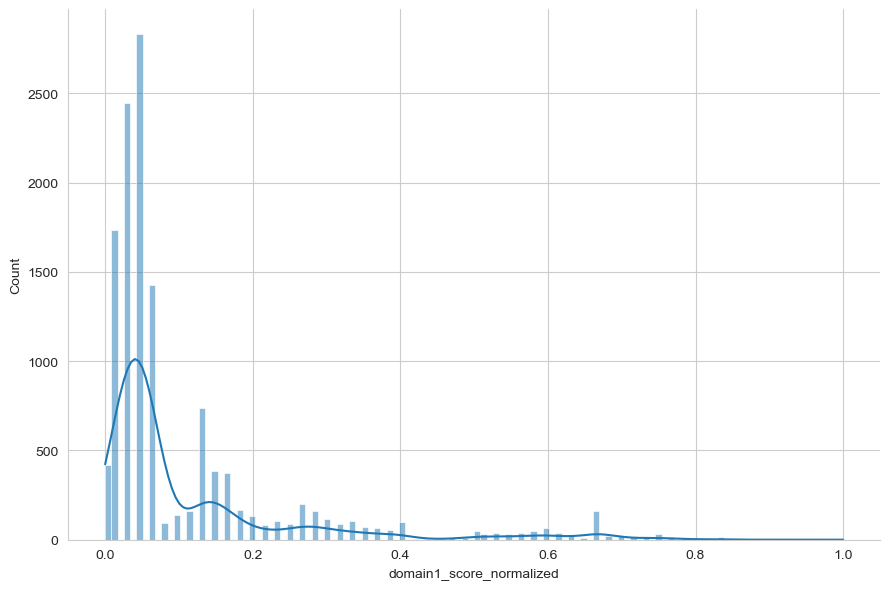

In [15]:
sns.displot(data=data['domain1_score_normalized'],kde=True,height=6.0,aspect=1.5,label='Note distribution after normalisation per essayset')

This is the reprensentation of all the grade in the dataset. Most of them are located on a small intervall<br>
To normalize more accurately, we will take into account the origin of the test.
We will normalize the score taking into account the min and max score of its belonging essay_set.

#### Normalize by essay_set

In [16]:
# Instantiate the MinMaxScaler
scaler = MinMaxScaler()

# Group the data by 'essay_set' and normalize 'domain1_score' within each group
data['domain1_score_normalized_peressayset'] = data.groupby('essay_set')['domain1_score'].transform(lambda x: (x - x.min()) / (x.max() - x.min()))


#Display
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.1, 0.2]",0.6
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.1, 0.2]",0.7
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.1, 0.2]",0.5
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.1, 0.2]",0.8
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.1, 0.2]",0.6


Text(0.5, 1.0, 'Distribution of Domain score after normalization according to essay_set')

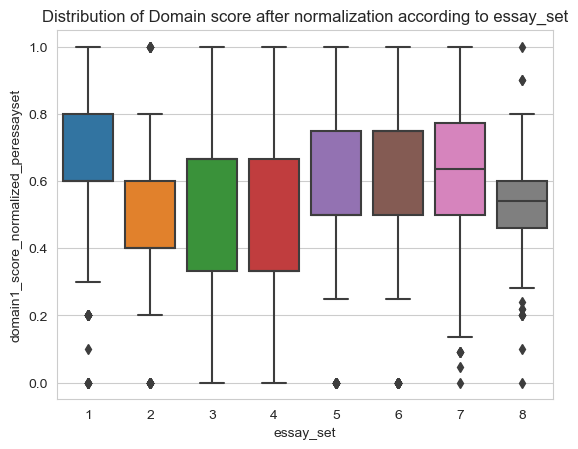

In [17]:
# plot data 
sns.boxplot(data=data,x='essay_set',y='domain1_score_normalized_peressayset',showfliers=True)
sns.set_style('whitegrid')
plt.title("Distribution of Domain score after normalization according to essay_set")

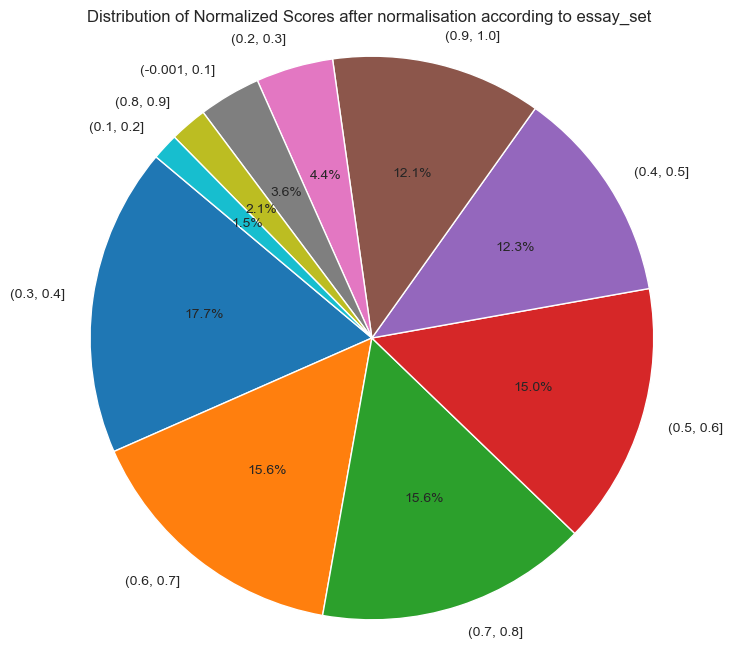

In [18]:
# Define the number of bins you want
num_bins = 10

# Create bins for 'domain1_score_normalized'
data['bins'] = pd.cut(data['domain1_score_normalized_peressayset'], num_bins)

# Get value counts of the bins
value_counts = data['bins'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(8, 8))
plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Normalized Scores after normalisation according to essay_set ')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

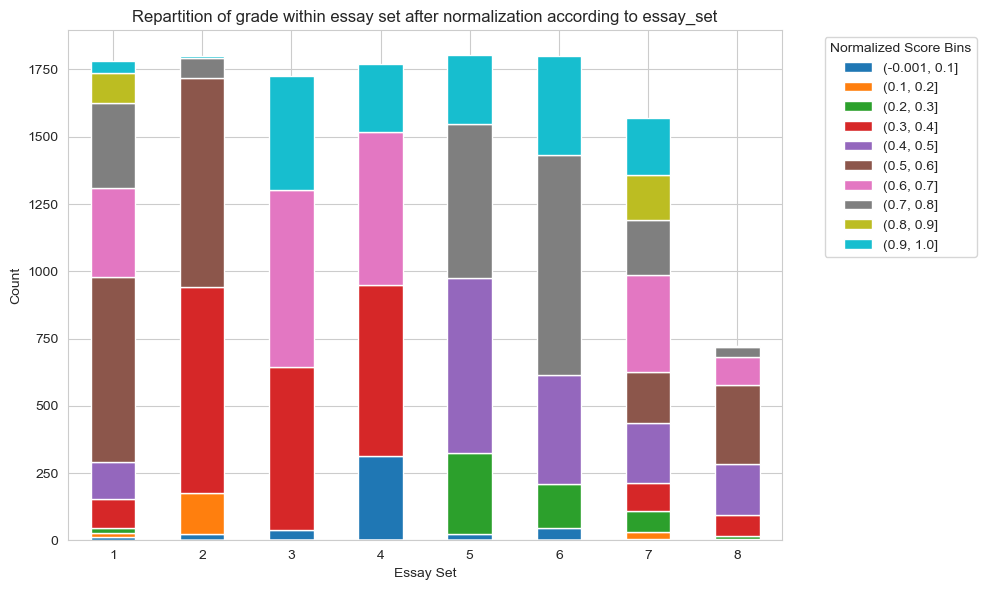

In [19]:
# Define the number of bins you want
num_bins = 10

# Create bins for 'domain1_score_normalized_peressayset'
data['bins'] = pd.cut(data['domain1_score_normalized_peressayset'], num_bins)

# Group by 'essay_set' and the bins, then get value counts
value_counts = data.groupby(['essay_set', 'bins']).size()

# Reset index to make 'essay_set' and 'bins' as columns
value_counts = value_counts.reset_index(name='count')

# Pivot the DataFrame to have 'essay_set' as index and 'bins' as columns
pivot_table = value_counts.pivot(index='essay_set', columns='bins', values='count')


# Plotting
pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Repartition of grade within essay set after normalization according to essay_set')
plt.xlabel('Essay Set')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Normalized Score Bins', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

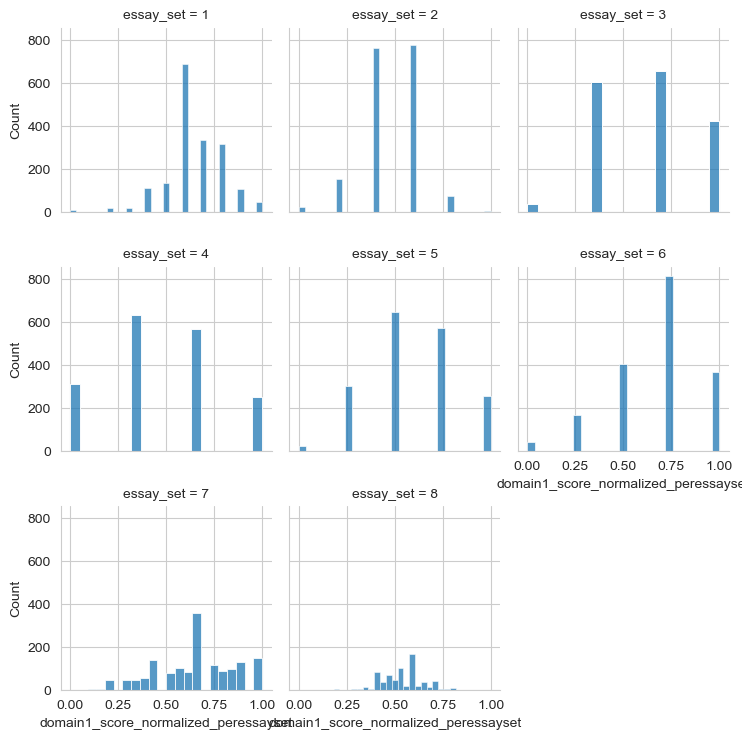

In [20]:
fg=sns.FacetGrid(data,col='essay_set', height=2.5,col_wrap=3,aspect=1)
fg.map(sns.histplot,"domain1_score_normalized_peressayset")

Text(0.5, 1.0, 'Distribution of domain1_score_normalized_per essay set')

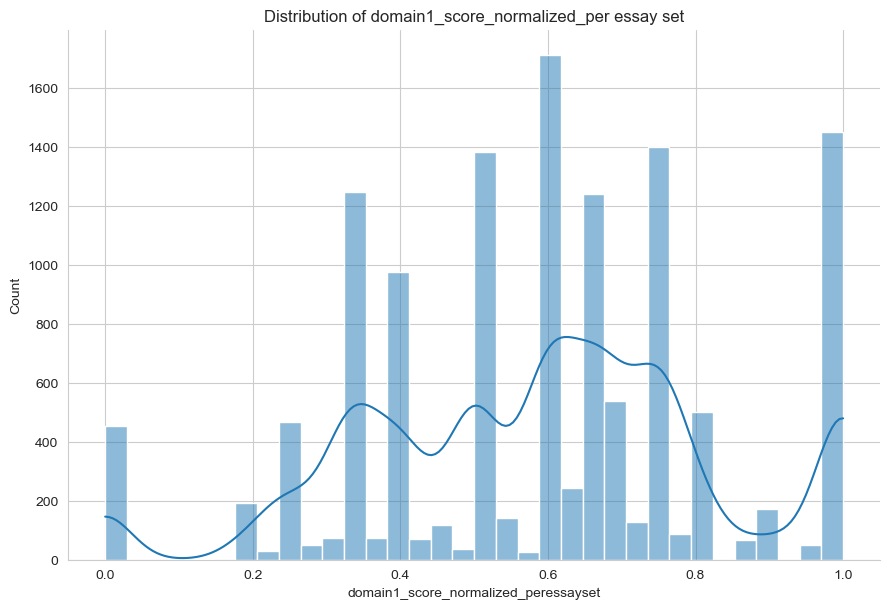

In [21]:
sns.displot(data=data['domain1_score_normalized_peressayset'],kde=True,height=6.0,aspect=1.5,label='Note distribution after normalisation per essay set')

plt.title('Distribution of domain1_score_normalized_per essay set')



Based on the five previous plots, after normalizing domain1_score taking into account the essay set number :
-  every grade in represented in the dataset
-  all grades no matter the essay set number is between 0 and 1
-  grades distribution was kept intact within each essay set
-  the grades in our overall dataset now have a better distribution on our 0 to 1 scale

### Imbalance on essay repartition

Thanks to the several previous bar charts, we notice an imbalance on number of essay per essay set.<br>
To obtain a balance dataset, we must undersample the essay sets which are over represented and oversample the one which is under represented.<br>
To perform the oversampling technique, we must create additionnal columns to group the grades under bins.

In [22]:
#column created to see the ckeck the proportion of Y in train set and test set
data['grades']=pd.cut(data['domain1_score_normalized_peressayset'],bins=[-0.01,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],
                      labels=['Categ1', 'Categ2','Categ3','Categ4','Categ5','Categ6','Categ7','Categ8','Categ9','Categ10'])

In [23]:
#column created to be able to correct imbalance on set 8.
data['forSMOTE']=pd.cut(data['domain1_score_normalized_peressayset'],bins=[-0.01,0.2,0.3,0.4,0.5,0.6,0.7,1.1],
                      labels=['SMOTECateg1', 'SMOTECateg2','SMOTECateg3','SMOTECateg4','SMOTECateg5','SMOTECateg6','SMOTECateg7'])

In [24]:
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5


In [25]:
data['grades'].isnull().sum()

0

In [26]:
data.shape

(12977, 9)

### Encoding

To be able to use the column essay in our model we need to encode it.<br>
For this purpose, the column essay will be encoded by Tf-idf vector. <br>
We take the first 500 most common word appearing in the essays to convert each essay into numerical value based on these words repetition <br>
Knowing that 75% of essays in the dataset contains 350 words, we choose to set our vector length to 500.

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_features=500)

# Adapting the vectorizer to the train data and transform it into TF-IDF vectors
data_tfidf = tfidf_vectorizer.fit_transform(data['essay'])

# Coverting the obtained column into a dataframe
data_tfidf_df = pd.DataFrame(data_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Reinitialised  DataFrame index before concatenation
data.reset_index(drop=True, inplace=True)

# Concat the new matrix with votre existing dataframe 
data_encoded = pd.concat([data.drop(columns=['essay']), data_tfidf_df], axis=1)

print('lenght', data_encoded.shape)
data_encoded.head()


lenght (12977, 508)


,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your
0,1,1,8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,0.000000,0.195658,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.052537,0.0,0.0,0.023389,0.0,0.000000,0.0,0.000000,0.035865,0.000000,0.000000,0.056591,0.000000,0.000000,0.0,0.00000,0.023556,0.0,0.0,0.000000,0.000000,0.053763,0.0,0.048330,0.0,0.000000,0.000000,0.000000,0.000000,0.019909,0.083529,0.0,0.0,0.000000,0.101758,0.081562,0.000000,0.039837,0.0,0.000000,0.038740,0.000000,0.0,0.0,0.0,0.023020,0.050700,0.000000,0.0,0.025663,0.023897,0.031350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.048623,0.0,0.0,0.00000,0.0,0.243422,0.000000,0.000000,0.0,0.0,0.276702,0.079256,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.046687,0.035286,0.000000,0.043630,0.036905,0.000000,0.000000,0.0,0.0,0.051479,0.0,0.0,0.0,0.043882,0.000000,0.0,0.049852,0.0,0.0,0.0,0.0

To make sure that grade have an ordinal value, we encode them with cat.cod

In [28]:
# encode grade column with cat encode to keep the ordinal meaning
for i in ['grades']:
    data_encoded[i]=data_encoded[i].astype('category').cat.codes

data_encoded.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your
0,1,1,8.0,0.133333,"(0.5, 0.6]",0.6,5,SMOTECateg5,0.000000,0.195658,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.052537,0.0,0.0,0.023389,0.0,0.000000,0.0,0.000000,0.035865,0.000000,0.000000,0.056591,0.000000,0.000000,0.0,0.00000,0.023556,0.0,0.0,0.000000,0.000000,0.053763,0.0,0.048330,0.0,0.000000,0.000000,0.000000,0.000000,0.019909,0.083529,0.0,0.0,0.000000,0.101758,0.081562,0.000000,0.039837,0.0,0.000000,0.038740,0.000000,0.0,0.0,0.0,0.023020,0.050700,0.000000,0.0,0.025663,0.023897,0.031350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.048623,0.0,0.0,0.00000,0.0,0.243422,0.000000,0.000000,0.0,0.0,0.276702,0.079256,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.046687,0.035286,0.000000,0.043630,0.036905,0.000000,0.000000,0.0,0.0,0.051479,0.0,0.0,0.0,0.043882,0.000000,0.0,0.049852,0.0,0.0,0.0,0.000000

We encode the column 'essay set' based on the probability for each essay to be graded more then the average grade in its essay_set.<br>

In [29]:
# Supposons que df soit votre DataFrame contenant les données
# Calculer la moyenne des notes par essay_set
average_scores = data_encoded.groupby('essay_set')['domain1_score_normalized_peressayset'].mean()

# Mapper les moyennes aux enregistrements correspondants dans votre DataFrame
data_encoded['average_score_by_essay_set'] = data_encoded['essay_set'].map(average_scores)


# Utilisation de np.where pour comparer chaque note avec la moyenne
data_encoded['comparison'] = np.where(data_encoded['domain1_score_normalized_peressayset'] > data_encoded['average_score_by_essay_set'], 1, 0)


# Afficher le DataFrame résultant
data_encoded.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,average_score_by_essay_set,comparison
0,1,1,8.0,0.133333,"(0.5, 0.6]",0.6,5,SMOTECateg5,0.000000,0.195658,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.052537,0.0,0.0,0.023389,0.0,0.000000,0.0,0.000000,0.035865,0.000000,0.000000,0.056591,0.000000,0.000000,0.0,0.00000,0.023556,0.0,0.0,0.000000,0.000000,0.053763,0.0,0.048330,0.0,0.000000,0.000000,0.000000,0.000000,0.019909,0.083529,0.0,0.0,0.000000,0.101758,0.081562,0.000000,0.039837,0.0,0.000000,0.038740,0.000000,0.0,0.0,0.0,0.023020,0.050700,0.000000,0.0,0.025663,0.023897,0.031350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.048623,0.0,0.0,0.00000,0.0,0.243422,0.000000,0.000000,0.0,0.0,0.276702,0.079256,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.046687,0.035286,0.000000,0.043630,0.036905,0.000000,0.000000,0.0,0.0,0.051479,0.0,0.0,0.0,0.043882,0.00

In [30]:
import category_encoders as ce

# Créez une instance de TargetEncoder
target_encoder = ce.TargetEncoder(cols=['essay_set'])

# Ajustez l'encodeur aux données d'entraînement et transformez la colonne essay_set
data_encoded['essay_set_target_encoded'] = target_encoder.fit_transform(data_encoded['essay_set'], data_encoded['comparison'])

# Afficher le DataFrame résultant
data_encoded.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,average_score_by_essay_set,comparison,essay_set_target_encoded
0,1,1,8.0,0.133333,"(0.5, 0.6]",0.6,5,SMOTECateg5,0.000000,0.195658,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.052537,0.0,0.0,0.023389,0.0,0.000000,0.0,0.000000,0.035865,0.000000,0.000000,0.056591,0.000000,0.000000,0.0,0.00000,0.023556,0.0,0.0,0.000000,0.000000,0.053763,0.0,0.048330,0.0,0.000000,0.000000,0.000000,0.000000,0.019909,0.083529,0.0,0.0,0.000000,0.101758,0.081562,0.000000,0.039837,0.0,0.000000,0.038740,0.000000,0.0,0.0,0.0,0.023020,0.050700,0.000000,0.0,0.025663,0.023897,0.031350,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.048623,0.0,0.0,0.00000,0.0,0.243422,0.000000,0.000000,0.0,0.0,0.276702,0.079256,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.046687,0.035286,0.000000,0.043630,0.036905,0.000000,0.000000,0.0,0.0,0.051479,

In [31]:
from sklearn.model_selection import train_test_split
X = data_encoded.drop(columns= ['average_score_by_essay_set','comparison'])
Y = data_encoded[['domain1_score_normalized_peressayset','grades','forSMOTE']]

### Splitting

We split our dataset into train and test by stratifying on the column 'grade' (which reprensent our target put into bins) to ensure a better repartition.

In [32]:
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.2, random_state=10, stratify=data_encoded['grades'])

#Display
print('Data train shape',X_train.shape)
print('Data test shape',X_test.shape)
print('Target train shape',Y_train.shape)
print('Target test shape',Y_test.shape)

Data train shape (10381, 509)
Data test shape (2596, 509)
Target train shape (10381, 3)
Target test shape (2596, 3)


In [33]:
Y_train['grades'].value_counts()/len(Y_train)*100

grades
3    17.705423
6    15.605433
7    15.595800
5    15.008188
4    12.349485
9    12.079761
2     4.431172
0     3.564204
8     2.138522
1     1.522011
Name: count, dtype: float64

In [34]:
Y_test['grades'].value_counts()/len(Y_test)*100

grades
3    17.719569
7    15.600924
6    15.600924
5    15.023112
4    12.326656
9    12.057011
2     4.429892
0     3.543914
8     2.157165
1     1.540832
Name: count, dtype: float64

### Analyze training set

In [35]:
# THIS IS THE COMPOSITION OF OUR TRAIN DATASET. WE CAN SEE THAT WE STILL HAVE AN IMBALANCE ON OUR DATASET.
X_train['essay_set'].value_counts()

essay_set
6    1447
3    1433
1    1424
5    1419
4    1406
2    1399
7    1267
8     586
Name: count, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

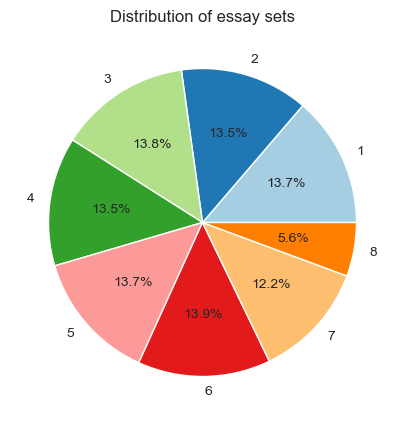

In [36]:
# Repatition of number essay in each categorie essay (graph)
plt.figure(figsize=(5, 5))
plt.pie(X_train['essay_set'].value_counts().sort_index(), labels=X_train['essay_set'].value_counts().sort_index().index, autopct='%1.1f%%', colors=plt.cm.Paired.colors)
plt.title('Distribution of essay sets')
plt.show

# NOTICE: WE STILL HAVE OUR IMBALANCE IN DATASET 8

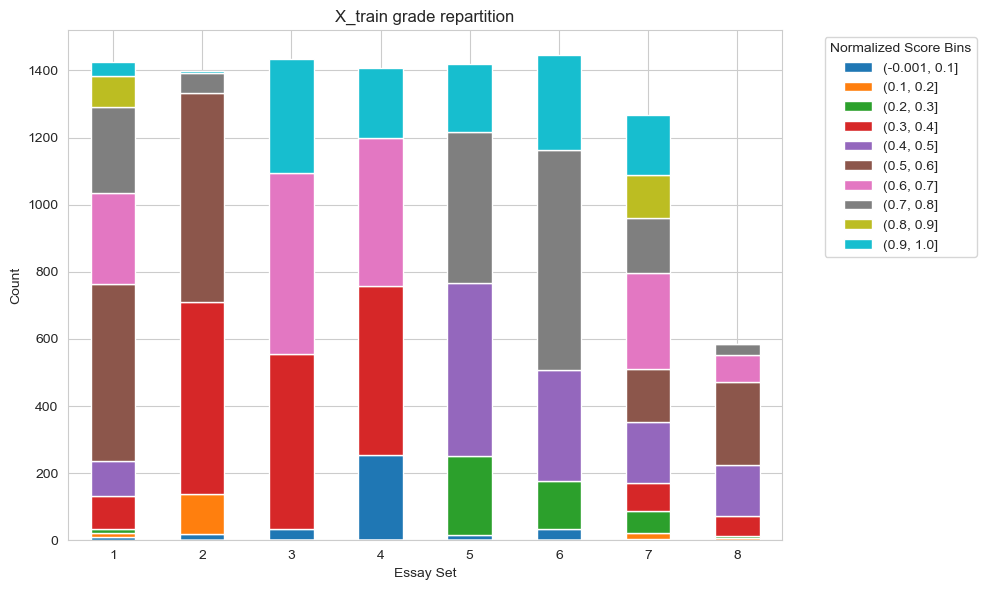

In [37]:
# Define the number of bins you want
num_bins = 10

# Create bins for 'domain1_score_normalized_peressayset'
X_train['bins'] = pd.cut(X_train['domain1_score_normalized_peressayset'], num_bins)

# Group by 'essay_set' and the bins, then get value counts
value_counts = X_train.groupby(['essay_set', 'bins']).size()

# Reset index to make 'essay_set' and 'bins' as columns
value_counts = value_counts.reset_index(name='count')

# Pivot the DataFrame to have 'essay_set' as index and 'bins' as columns
pivot_table = value_counts.pivot(index='essay_set', columns='bins', values='count')


# Plotting
pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('X_train grade repartition')
plt.xlabel('Essay Set')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Normalized Score Bins', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [38]:
X_train[X_train['essay_set'] == 4][['domain1_score_normalized_peressayset','grades']].value_counts()

domain1_score_normalized_peressayset  grades
0.333333                              3         504
0.666667                              6         443
0.000000                              0         253
1.000000                              9         206
Name: count, dtype: int64

Remark: ALL GRADE IS REPRESENTED IN EVERY ESSAY SET. Some essay set does not have some category reprensented, which is normal as originally they have a limited possibility of grade.       
For example essay set 4, originally graded between 0 and 4, will only take 4 unique values afternormalization, therefore it can have a maximum of 4 categories and the others will be empty<br>

WE DECIDED TO EQUILIBRATE ALL DATASET TO HAVE 1200 ESSAYS IN EACH SET

### Undersampling

As essay set 1 to 7  got more than 1500 essays each, we are going to perform undersampling to reach 1200 by deleating essay on the grade categories that are the most represented

In [39]:
subset_1 = X_train[X_train['essay_set'] == 1].sample(n=1200, replace=True, random_state=42)

In [40]:
subset_2 = X_train[X_train['essay_set'] == 2].sample(n=1200, replace=True, random_state=42)

In [41]:
subset_3 = X_train[X_train['essay_set'] == 3].sample(n=1200, replace=True, random_state=42)

In [42]:
subset_4 = X_train[X_train['essay_set'] == 4].sample(n=1200, replace=True, random_state=42)
subset_4 = pd.concat([subset_1, subset_2, subset_3, subset_4], ignore_index=True)

In [43]:
subset_5 = X_train[X_train['essay_set'] == 5].sample(n=1200, replace=True, random_state=42)

In [44]:
subset_6 = X_train[X_train['essay_set'] == 6].sample(n=1200, replace=True, random_state=42)
subset_6 = pd.concat([subset_5, subset_6], ignore_index=True)

In [45]:
subset_7 = X_train[X_train['essay_set'] == 7].sample(n=1200, replace=True, random_state=42)

In [46]:
# Concatenate data in one DataFrame
X_train_essay_set_1a7 = pd.concat([subset_4, subset_6, subset_7], ignore_index=True)

# Display the shape oh the resulting concatenation
X_train_essay_set_1a7.shape

(8400, 509)

In [47]:
X_train_essay_set_1a7.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded
0,444,1,8.0,0.133333,"(0.5, 0.6]",0.6,5,SMOTECateg5,0.049439,0.059372,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.085169,0.000000,0.0,0.0,0.093795,0.043533,0.000000,0.000000,0.223245,0.039538,0.000000,0.000000,0.0,0.057185,0.0,0.0,0.042565,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.048332,0.000000,0.000000,0.044841,0.000000,0.000000,0.04950,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.280343,0.087019,0.114159,0.180558,0.203558,0.0,0.061069,0.065872,0.141692,0.076106,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.239901,0.240504,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.052959,0.0,0.000000,0.0,0.0,0.0,0.031242,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.043772,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000

### Oversampling

To reach 1200 essays in essay set 8 , we perform oversampling.

In [48]:
# Selecting just essay_set_8 data
X_train_essay_set_8= X_train[X_train['essay_set'] == 8]
X_train_essay_set_8

,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded
12843,21456,8,39.0,0.650000,"(0.5, 0.6]",0.58,5,SMOTECateg5,0.000000,0.024243,0.000000,0.000000,0.000000,0.058042,0.000000,0.000000,0.000000,0.000000,0.022023,0.0,0.057960,0.000000,0.000000,0.000000,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.087557,0.053293,0.000000,0.047907,0.000000,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.000000,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.000000,0.000000,0.073177,0.000000,0.00000,0.018375,0.068455,0.025128,0.025907,0.000000,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.564840,0.028928,0.000000,0.083260,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.056254,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.

In [49]:
X_train[X_train['essay_set'] == 8]['grades'].value_counts()
#Some categories has only few notes and we can't oversample categories with only one note using SMOTE.
#To avoid any isolated grade when performing SMOTE we are going to create larger bins . This has  been done in the "forSMOTE" column.

grades
5    249
4    150
6     81
3     60
7     32
2      7
1      4
0      2
9      1
Name: count, dtype: int64

In [50]:
X_train[X_train['essay_set'] == 8]['forSMOTE'].value_counts()

forSMOTE
SMOTECateg5    249
SMOTECateg4    150
SMOTECateg6     81
SMOTECateg3     60
SMOTECateg7     33
SMOTECateg2      7
SMOTECateg1      6
Name: count, dtype: int64

### SMOTE

In this part, we increased the number of essay per grade using the bins in forSMOTE column to reach 1200 essay in total while keeping the initial grade repartition

In [51]:
X_train_essay_set_8.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded
12843,21456,8,39.0,0.650000,"(0.5, 0.6]",0.58,5,SMOTECateg5,0.000000,0.024243,0.0,0.0,0.0,0.058042,0.0,0.0,0.0,0.0,0.022023,0.0,0.057960,0.0,0.000000,0.0,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.0,0.0,0.000000,0.0,0.0,0.000000,0.087557,0.053293,0.0,0.047907,0.0,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.0,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.0,0.0,0.073177,0.0,0.0,0.018375,0.068455,0.025128,0.025907,0.0,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.56484,0.028928,0.0,0.08326,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.056254,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023139,0.052466,0.0,0.0,0.000000,0.020183,0.000000,0.0,0.0,0.025514,0.0,0.000000,0.000000,0.0,0.035131,0.023081,0.0,0.053619,0.00000

In [52]:
X_train_essay_set_8['forSMOTE'].value_counts()

forSMOTE
SMOTECateg5    249
SMOTECateg4    150
SMOTECateg6     81
SMOTECateg3     60
SMOTECateg7     33
SMOTECateg2      7
SMOTECateg1      6
Name: count, dtype: int64

In [53]:
# Function to compute the repartition of each grades in the dataset and to compute the equivalents numbers for the target size
def compute_repartition_grades(df, target_col, target_size):
    repartition_grades = df[target_col].value_counts(normalize=True) * 100
    number_target_size = {}

    total_repartition = repartition_grades.sum()
    sum_ = 0

    for grade, percentage in repartition_grades.items():
        total = round((percentage / total_repartition) * target_size)
        number_target_size[grade] = total
        sum_ += total

    # Ajuster le dernier nombre pour que la somme soit égale à chiffre_cible
    number_target_size[grade] += target_size - sum_

    return repartition_grades, number_target_size

repartition_grades, number_target_size = compute_repartition_grades(X_train_essay_set_8, 'forSMOTE', 1200)

print("Grades repartition :")
print(repartition_grades)
print("\n Equivalents numbers for target size 1200")
print(number_target_size)

# Calcul de la somme des nombres
sum_ = sum(number_target_size.values())
print("\nSum of the equivalents numbers :", sum_)

Grades repartition :
forSMOTE
SMOTECateg5    42.491468
SMOTECateg4    25.597270
SMOTECateg6    13.822526
SMOTECateg3    10.238908
SMOTECateg7     5.631399
SMOTECateg2     1.194539
SMOTECateg1     1.023891
Name: proportion, dtype: float64

 Equivalents numbers for target size 1200
{'SMOTECateg5': 510, 'SMOTECateg4': 307, 'SMOTECateg6': 166, 'SMOTECateg3': 123, 'SMOTECateg7': 68, 'SMOTECateg2': 14, 'SMOTECateg1': 12}

Sum of the equivalents numbers : 1200


In [54]:
Y_smote_8 = X_train_essay_set_8[['forSMOTE']]
Y_smote_8

,forSMOTE
12843,SMOTECateg5
12715,SMOTECateg5
12283,SMOTECateg4
12719,SMOTECateg4
12420,SMOTECateg4
12334,SMOTECateg4
12375,SMOTECateg4
12859,SMOTECateg3
12752,SMOTECateg4
12313,SMOTECateg5


In [56]:
#X_smote = X_train_essay_set_8.iloc[:, :-2]
X_smote = X_train_essay_set_8.drop(columns=['bins', 'forSMOTE'])
X_smote.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,domain1_score_normalized_peressayset,grades,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded
12843,21456,8,39.0,0.650000,0.58,5,0.000000,0.024243,0.0,0.0,0.0,0.058042,0.0,0.0,0.0,0.0,0.022023,0.0,0.057960,0.0,0.000000,0.0,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.0,0.0,0.000000,0.0,0.0,0.000000,0.087557,0.053293,0.0,0.047907,0.0,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.0,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.0,0.0,0.073177,0.0,0.0,0.018375,0.068455,0.025128,0.025907,0.0,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.56484,0.028928,0.0,0.08326,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.056254,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023139,0.052466,0.0,0.0,0.000000,0.020183,0.000000,0.0,0.0,0.025514,0.0,0.000000,0.000000,0.0,0.035131,0.023081,0.0,0.053619,0.000000,0.023466,0.0,0.0,0.0,0.000000,0.00000

In [57]:
 # Applying SMOTE to the dataset
smote = SMOTE(sampling_strategy = number_target_size, random_state=42, k_neighbors=1)
X_resampled, y_resampled = smote.fit_resample(X_smote, Y_smote_8)

# Creating a dataframe for the result
X_train_Essay_set_8_afterSMOTE = pd.DataFrame(X_resampled, columns=X_smote.columns)
X_train_Essay_set_8_afterSMOTE['forSMOTE'] = y_resampled
# Printing after SMOTE
print("Dataset after SMOTE :")
X_train_Essay_set_8_afterSMOTE.head()

Dataset after SMOTE :


,essay_id,essay_set,domain1_score,domain1_score_normalized,domain1_score_normalized_peressayset,grades,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded,forSMOTE
0,21456,8,39.0,0.650000,0.58,5,0.000000,0.024243,0.0,0.0,0.0,0.058042,0.0,0.0,0.0,0.0,0.022023,0.0,0.057960,0.0,0.000000,0.0,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.0,0.0,0.000000,0.0,0.0,0.000000,0.087557,0.053293,0.0,0.047907,0.0,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.0,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.0,0.0,0.073177,0.0,0.0,0.018375,0.068455,0.025128,0.025907,0.0,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.56484,0.028928,0.0,0.08326,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.056254,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023139,0.052466,0.0,0.0,0.000000,0.020183,0.000000,0.0,0.0,0.025514,0.0,0.000000,0.000000,0.0,0.035131,0.023081,0.0,0.053619,0.000000,0.023466,0.0,0.0,0.0,0.000000,0.

In [58]:
# we must remove the column bins, before appendinf the 2 parts because this column is not common to both part
X_train_essay_set_1a7=X_train_essay_set_1a7.drop(columns=['bins'],axis=1)                                            

In [59]:
# Reminder of what our essay set from 1 to 7 look like
X_train_essay_set_1a7.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,domain1_score_normalized_peressayset,grades,forSMOTE,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded
0,444,1,8.0,0.133333,0.6,5,SMOTECateg5,0.049439,0.059372,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.085169,0.000000,0.0,0.0,0.093795,0.043533,0.000000,0.000000,0.223245,0.039538,0.000000,0.000000,0.0,0.057185,0.0,0.0,0.042565,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.048332,0.000000,0.000000,0.044841,0.000000,0.000000,0.04950,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.280343,0.087019,0.114159,0.180558,0.203558,0.0,0.061069,0.065872,0.141692,0.076106,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.239901,0.240504,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.052959,0.0,0.000000,0.0,0.0,0.0,0.031242,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.043772,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.00000,0.000000

In [60]:
# Reminder of what our essay set from 1 to 7 look like
X_train_Essay_set_8_afterSMOTE.head()

,essay_id,essay_set,domain1_score,domain1_score_normalized,domain1_score_normalized_peressayset,grades,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded,forSMOTE
0,21456,8,39.0,0.650000,0.58,5,0.000000,0.024243,0.0,0.0,0.0,0.058042,0.0,0.0,0.0,0.0,0.022023,0.0,0.057960,0.0,0.000000,0.0,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.0,0.0,0.000000,0.0,0.0,0.000000,0.087557,0.053293,0.0,0.047907,0.0,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.0,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.0,0.0,0.073177,0.0,0.0,0.018375,0.068455,0.025128,0.025907,0.0,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.56484,0.028928,0.0,0.08326,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.056254,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023139,0.052466,0.0,0.0,0.000000,0.020183,0.000000,0.0,0.0,0.025514,0.0,0.000000,0.000000,0.0,0.035131,0.023081,0.0,0.053619,0.000000,0.023466,0.0,0.0,0.0,0.000000,0.

In [61]:
# Fusionner les deux DataFrames pour avoir notre X train
balanced_X_train = pd.concat([X_train_Essay_set_8_afterSMOTE, X_train_essay_set_1a7], ignore_index=True)

# Afficher le DataFrame résultant
print('Data Shape',balanced_X_train.shape)
balanced_X_train.head()

Data Shape (9600, 508)


,essay_id,essay_set,domain1_score,domain1_score_normalized,domain1_score_normalized_peressayset,grades,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded,forSMOTE
0,21456,8,39.0,0.650000,0.58,5,0.000000,0.024243,0.0,0.0,0.0,0.058042,0.0,0.0,0.0,0.0,0.022023,0.0,0.057960,0.0,0.000000,0.0,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.0,0.0,0.000000,0.0,0.0,0.000000,0.087557,0.053293,0.0,0.047907,0.0,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.0,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.0,0.0,0.073177,0.0,0.0,0.018375,0.068455,0.025128,0.025907,0.0,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.56484,0.028928,0.0,0.08326,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.056254,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023139,0.052466,0.0,0.0,0.000000,0.020183,0.000000,0.0,0.0,0.025514,0.0,0.000000,0.000000,0.0,0.035131,0.023081,0.0,0.053619,0.000000,0.023466,0.0,0.0,0.0,0.000000,0.

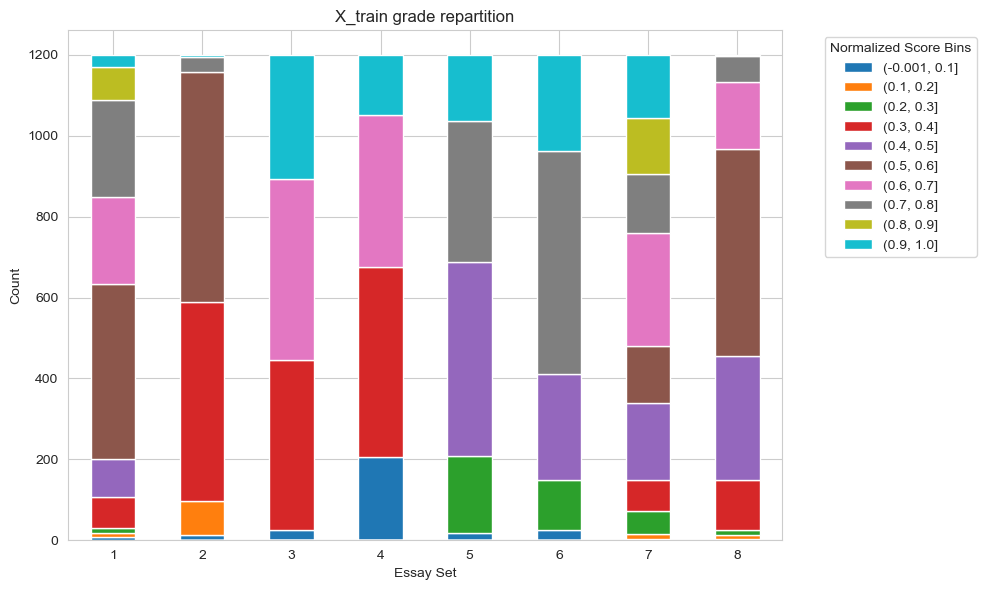

In [62]:
# Define the number of bins you want
num_bins = 10

# Create bins for 'domain1_score_normalized_peressayset'
balanced_X_train['bins'] = pd.cut(balanced_X_train['domain1_score_normalized_peressayset'], num_bins)

# Group by 'essay_set' and the bins, then get value counts
value_counts = balanced_X_train.groupby(['essay_set', 'bins']).size()

# Reset index to make 'essay_set' and 'bins' as columns
value_counts = value_counts.reset_index(name='count')

# Pivot the DataFrame to have 'essay_set' as index and 'bins' as columns
pivot_table = value_counts.pivot(index='essay_set', columns='bins', values='count')


# Plotting
pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('X_train grade repartition')
plt.xlabel('Essay Set')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Normalized Score Bins', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [63]:
# because it was created with the graph we have to delete it
balanced_X_train=balanced_X_train.drop(columns=['bins'],axis=1)  

In [64]:
# Defining the columns we are going to keep for the Y_train that we are going to feed our base model 
Y_train=balanced_X_train['domain1_score_normalized_peressayset']
Y_train.head()

0    0.58
1    0.54
2    0.48
3    0.48
4    0.48
Name: domain1_score_normalized_peressayset, dtype: float64

In [65]:
X_train=balanced_X_train.drop(columns=['essay_id','essay_set','domain1_score','domain1_score_normalized','domain1_score_normalized_peressayset','grades','forSMOTE'])
X_train.head()

,able,about,adults,affect,affected,after,again,against,age,agree,air,airships,all,allow,almost,alot,also,always,am,an,and,another,any,anyone,anything,are,area,areas,around,as,ask,asked,at,attempting,author,away,back,bad,be,because,become,been,before,being,believe,best,better,big,book,books,both,brother,builders,building,but,by,called,came,can,caps1,caps2,caps3,caps4,caps5,caps6,caps7,caps8,caps9,car,cause,censorship,certain,change,check,child,children,close,come,comes,computer,computers,concludes,conclusion,coordination,could,couldn,country,created,cuban,currents,cyclist,dad,date1,day,days,dear,did,didn,different,dirigible,dirigibles,do,dock,does,doesn,doing,don,done,dont,down,due,each,effect,else,empire,end,enjoy,enough,etc,even,ever,every,everyone,everything,example,exercise,eye,eyes,face,faced,fact,family,far,features,feel,feeling,felt,few,finally,find,first,flammable,flying,for,forget,found,frame,friend,friends,from,fun,funny,game,games,gave,geese,get,getting,girl,give,gives,go,going,good,got,grateful,great,had,hand,happen,happened,happy,hard,has,have,having,he,hear,help,helps,her,here,hibiscus,high,highly,hills,him,his,home,hope,hot,hour,hours,house,how,however,hydrogen,idea,if,important,in,information,instead,internet,into,is,it,its,just,keep,kept,kid,kids,kind,knew,know,last,lastly,later,laugh,laughing,laughter,law,learn,learned,learning,left,less,let,libraries,library,life,like,limit,line,listen,little,live,lives,location1,location2,long,look,looked,looking,lot,love,low,made,magazines,make,makes,making,many,mast,material,materials,matter,maybe,me,mean,means,memoir,might,mind,minutes,mom,money,month1,mood,mooring,more,most,mother,movie,movies,much,music,my,myself,narciso,nature,need,needed,never,new,newspaper,next,no,not,nothing,now,num1,num2,num3,obstacle,obstacles,of,off,offensive,old,on,once,one,online,only,open,opinion,or,organization1,organization2,other,others,our,out,outside,over,own,paragraph,parents,part,past,patience,patient,people,person,person1,person2,place,places,plant,play,playing,point,positive,problem,problems,public,put,rather,re,read,reader,reading,real,realized,really,reason,reasons,remember,remove,removed,research,ride,right,road,rodriguez,room,saeng,safe,safety,said,same,saw,say,saying,says,school,second,see,seen,setting,she,shelf,shelves,should,shouldn,show,shows,simple,since,sister,so,society,some,someone,something,sometimes,spend,spring,start,started,state,states,stay,still,stop,story,stress,students,stuff,such,sure,take,taken,taking,talk,talking,teach,technology,tell,test,than,that,thats,the,their,them,then,there,these,they,thing,things,think,this,those,though,thought,three,through,time,times,to,today,together,told,too,took,top,town,try,trying,turned,two,type,understand,until,up,urban,us,use,used,using,ve,very,violent,wait,waiting,want,wanted,wants,was,wasn,watch,water,way,ways,we,websites,well,went,were,what,when,where,which,while,who,whole,why,will,wind,winds,winter,with,without,words,work,world,would,wouldn,write,wrong,year,years,york,you,young,your,essay_set_target_encoded
0,0.000000,0.024243,0.0,0.0,0.0,0.058042,0.0,0.0,0.0,0.0,0.022023,0.0,0.057960,0.0,0.000000,0.0,0.000000,0.035551,0.022632,0.014611,0.189324,0.016144,0.036582,0.0,0.0,0.000000,0.0,0.0,0.000000,0.087557,0.053293,0.0,0.047907,0.0,0.0,0.019439,0.016575,0.000000,0.029603,0.000000,0.0,0.000000,0.020958,0.000000,0.020212,0.000000,0.019744,0.000000,0.0,0.0,0.073177,0.0,0.0,0.018375,0.068455,0.025128,0.025907,0.0,0.000000,0.035532,0.046614,0.368629,0.041559,0.000000,0.049872,0.56484,0.028928,0.0,0.08326,0.0,0.0,0.0,0.000000,0.0,0.000000,0.00000,0.000000,0.056254,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.023139,0.052466,0.0,0.0,0.000000,0.020183,0.000000,0.0,0.0,0.025514,0.0,0.000000,0.000000,0.0,0.035131,0.023081,0.0,0.053619,0.000000,0.023466,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.014919,0.040449,0.00000,0.038959,0.0,0.000000,0.0,0.0,0.081043,0.049516,0.0,0.0,0.0,0.0,0.0,0.000000,0.133232,0.026008

In [66]:
Y_test = X_test['domain1_score_normalized_peressayset']

In [67]:
X_test = X_test.drop(columns=['essay_id','bins','essay_set','domain1_score','domain1_score_normalized','domain1_score_normalized_peressayset','grades','forSMOTE'])

## Base model

In [68]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the linear regression model
model_lr = LinearRegression()

# Train the model
model_lr.fit(X_train, Y_train)

# Prediect on the test value 
predictions_lr = model_lr.predict(X_test)

# Evaluate the model
accuracy_lr = model_lr.score(X_test, Y_test)

# Display model performance
print(f'Accuracy: {accuracy_lr:.2f}')

# Calculate mean square error (MSE)
mse = mean_squared_error(Y_test, predictions_lr)

# Calculate Coefficient of determination (R-squared, R²)
r_squared = r2_score(Y_test, predictions_lr)

# Afficher les métriques
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'R-squared (R²): {r_squared:.2f}')

Accuracy: 0.53
Mean Squared Error (MSE): 0.03
R-squared (R²): 0.53


In [69]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize Random Forest model
model_rf = RandomForestRegressor(random_state=100)

# train model
model_rf.fit(X_train, Y_train)

# Prediect on the test value 
predictions_rf = model_rf.predict(X_test)

# Calculate mean square error (MSE)
mse_rf = mean_squared_error(Y_test, predictions_rf)

# Calculate Coefficient of determination (R-squared, R²)
r_squared_rf = r2_score(Y_test, predictions_rf)

# Display metrics
print(f'Mean Squared Error (MSE) - Random Forest: {mse_rf:.2f}')
print(f'R-squared (R²) - Random Forest: {r_squared_rf:.2f}')


Mean Squared Error (MSE) - Random Forest: 0.03
R-squared (R²) - Random Forest: 0.55


In [70]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialiaze XGBoost model for regression
model_xgb = XGBRegressor()

# Train model
model_xgb.fit(X_train, Y_train)

# Prediect on the test value
predictions_xgb = model_xgb.predict(X_test)

# Calculate mean square error (MSE)
mse_xgb = mean_squared_error(Y_test, predictions_xgb)

# Calculate Coefficient of determination (R-squared, R²)
r_squared_xgb = r2_score(Y_test, predictions_xgb)

# Évaluate model
accuracy_xgb = model_xgb.score(X_test, Y_test)

# Afficher les performances du modèle
print(f'Accuracy: {accuracy_xgb:.2f}')

# Display metrics
print(f'Mean Squared Error (MSE) - XGBoost: {mse_xgb:.2f}')
print(f'R-squared (R²) - XGBoost: {r_squared_xgb:.2f}')

Accuracy: 0.55
Mean Squared Error (MSE) - XGBoost: 0.03
R-squared (R²) - XGBoost: 0.55


## Feature Engineering

In this part we will try to improve our score by creating features

### Count punctuations

In [71]:
def compter_punctuation(essai):
    # List of punctual signal
    punctuations = string.punctuation
 
    # counter
    count_punctuation = 0
 
    # check each character and count punctiation
    for char in essai:
        if char in punctuations:
            count_punctuation += 1
 
    # return number of punctuation
    return count_punctuation

In [72]:
data['count_punctuation'] = data['essay'].apply(compter_punctuation)

### Count Coordinatining word

In [73]:
def count_coordinating_conjunctions(text):
    
    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'CC')

data['count_coordinating_conjunctions'] = data['essay'].apply(count_coordinating_conjunctions)

### Count determiners

In [74]:
def count_determiners(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'DT')

In [75]:
data['count_determiners'] = data['essay'].apply(count_determiners)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54


### Count Prepositions

In [76]:
def count_prepositions(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'IN')

In [77]:
data['count_prepositions'] = data['essay'].apply(count_prepositions)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43


### Count adjectives

In [78]:
def count_adjectives(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos.startswith('JJ'))

In [79]:
data['count_adjectives'] = data['essay'].apply(count_adjectives)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32


### Count base verb

In [80]:
def count_verbs_base_form(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'VB')

In [81]:
data['count_verbs_base_form'] = data['essay'].apply(count_verbs_base_form)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42


### Count singular nouns

In [82]:
def count_nouns_singular_mass(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'NN')

In [83]:
data['count_nouns_singular_mass'] = data['essay'].apply(count_nouns_singular_mass)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66


### Count plural nouns

In [84]:
def count_nouns_plural(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'NNS')

In [85]:
data['count_nouns_plural'] = data['essay'].apply(count_nouns_plural)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41


### Count Possesive ending

In [86]:
def count_possessive_endings(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'POS')

In [87]:
data['count_possessive_endings'] = data['essay'].apply(count_possessive_endings)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0


### Count personal pronouns

In [88]:
def count_personal_pronouns(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'PRP')

In [89]:
data['count_personal_pronouns'] = data['essay'].apply(count_personal_pronouns)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24


### Count Possesive pronouns

In [90]:
def count_possessive_pronouns(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'PRP$')

In [91]:
data['count_possessive_pronouns'] = data['essay'].apply(count_possessive_pronouns)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4


### Count adverbs

In [92]:
def count_adverbs(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos.startswith('RB'))

In [93]:
data['count_adverbs'] = data['essay'].apply(count_adverbs)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36


### Count past tense

In [94]:
def count_verbs_past_tense_and_past_participle(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'VBD' or pos == 'VBN')

In [95]:
data['count_verbs_past_tense_and_past_participle'] = data['essay'].apply(count_verbs_past_tense_and_past_participle)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4


### Count interjections

In [96]:
def count_interjections(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'UH')

In [97]:
data['count_interjections'] = data['essay'].apply(count_interjections)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0


### Count verbs gerund & co

In [98]:
def count_verbs_gerund_present_participle(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'VBG')

In [99]:
data['count_verbs_gerund_present_participle'] = data['essay'].apply(count_verbs_gerund_present_participle)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6


### Count wh determiners

In [100]:
def count_wh_determiners(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'WDT')

In [101]:
data['count_wh_determiners'] = data['essay'].apply(count_wh_determiners)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3


### Counts wh_pronouns

In [102]:
def count_wh_pronouns(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'WP')

In [103]:
data['count_wh_pronouns'] = data['essay'].apply(count_wh_pronouns)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1


### Count possesif wh pronouns

In [104]:
def count_possessive_wh_pronouns(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'WP$')

In [105]:
data['count_possessive_wh_pronouns'] = data['essay'].apply(count_possessive_wh_pronouns)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0


### Count wh adverbs

In [106]:
def count_wh_adverbs(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'WRB')

In [107]:
data['count_wh_adverbs'] = data['essay'].apply(count_wh_adverbs)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5


### Count Modals

In [108]:
def count_modals(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'MD')

In [109]:
data['count_modals'] = data['essay'].apply(count_modals)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26


### Counts verbs no 3rd person

In [110]:
def count_verb_non_3rd_person_singular_present(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'VBP')

In [111]:
data['count_verb_non_3rd_person_singular_present'] = data['essay'].apply(count_verb_non_3rd_person_singular_present)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19


### Count verb 3rd person

In [112]:
def count_verb_3rd_person_singular_present(text):

    words = word_tokenize(text)

    pos_tags = pos_tag(words)

    return sum(1 for word, pos in pos_tags if pos == 'VBZ')

In [113]:
data['count_verb_3rd_person_singular_present'] = data['essay'].apply(count_verb_3rd_person_singular_present)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16


### Count special word

In [114]:
def find_special_word(text):
    pattern = r'@(\w+)'
    matches = re.findall(pattern, text)
    return len(matches)

In [115]:
data['special word'] = data['essay'].apply(find_special_word)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4


### Count Words

In [116]:
def count_words(text):
    # Tokenize the text
    tokens = word_tokenize(text)
    
    # Return the count of words
    return len(tokens)

In [117]:
data['count word'] = data['essay'].apply(count_words)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word,count word
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5,386
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10,464
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7,313
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41,611
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4,517


### Count Sentences

In [118]:
#DEFINE A FUNCTION TO COUNT THE NB OF SENTENCE 
def count_sentences(text):
    # Tokenize the text
    sentences = sent_tokenize(text)
    
    # Return the count of words
    return len(sentences)

In [119]:
data['count sentences'] = data['essay'].apply(count_sentences)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word,count word,count sentences
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5,386,16
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10,464,20
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7,313,14
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41,611,27
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4,517,30


### Average Sentence Length

In [120]:
def sentence_lenght_avg (text):
    # Tokenize the text
    token_sentence = sent_tokenize(text)
    token_word = word_tokenize(text)
       
    
    # Return the count of words
    return (len(token_word)/len(token_sentence))

In [121]:
data['senetence length avg'] = data['essay'].apply(sentence_lenght_avg)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word,count word,count sentences,senetence length avg
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5,386,16,24.125000
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10,464,20,23.200000
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7,313,14,22.357143
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41,611,27,22.629630
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4,517,30,17.233333


### Number of Stopword

In [122]:
 def nb_stopwords(text):
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    stopwords_list = [word for word in tokens if word.lower() in stop_words]
    nb_stopwords=len(stopwords_list)
    nb_words=len(tokens)

    return (nb_stopwords)

In [123]:
data['number Stopword'] = data['essay'].apply(nb_stopwords)
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word,count word,count sentences,senetence length avg,number Stopword
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5,386,16,24.125000,176
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10,464,20,23.200000,195
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7,313,14,22.357143,143
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41,611,27,22.629630,223
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4,517,30,17.233333,241


### ratio stopwords

In [124]:
def ratio_stopwords(text):
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    stopwords_list = [word for word in tokens if word.lower() in stop_words]
    nb_stopwords = len(stopwords_list)
    nb_words = len(tokens)
    ratio_stopwords = nb_stopwords/nb_words*100
    return ratio_stopwords

In [125]:
data['ratio_stopwords'] = data['essay'].apply(ratio_stopwords)

### Heatmap

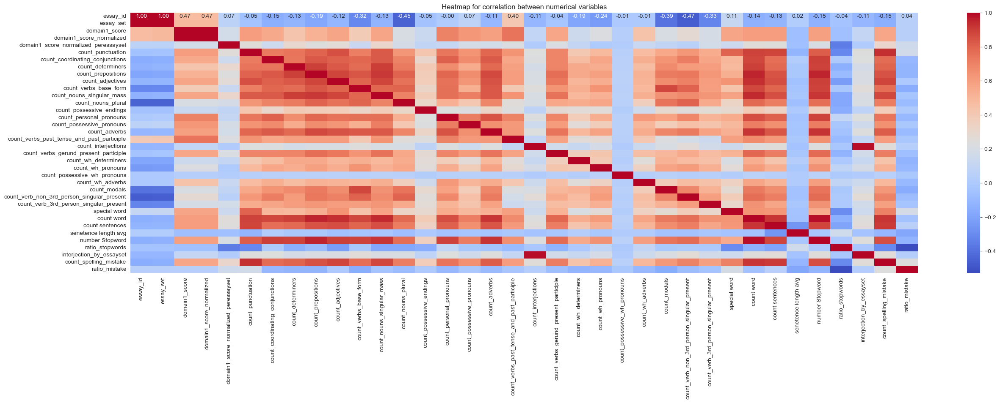

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create plt.subplots()
fig, ax = plt.subplots(figsize=(30, 8))

# Exclude categorical columns
numeric_data = data.select_dtypes(include=['float64', 'int64'])

# Heatmap for correlation between numerical variables
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap for correlation between numerical variables')
plt.show()

### Features based on interjections

At first sight count interjections do not have relation with the target because on the heatmap correlation is too low (0.15). 
After many analysis we found that count_interjections act on the domain1_score depending on the essay_set.
- For essay_set 1,2,7,8 more count_interjections we have better will be the grade.
- For essay_set 3 & 4 presence of interjections have no impact on target
- For essay_set 5 if you get at least 1 interjections you will get the mean or more
- For esasy_set 6 once you have any interjection you won't have 0

In [132]:
data[(data['essay_set'] ==8) & (data['count_interjections'] == 3)][['domain1_score']].value_counts().sort_index()

domain1_score
30.0             1
Name: count, dtype: int64

In [133]:
data[data['essay_set'] == 1]['count_interjections'].value_counts()

count_interjections
0    1560
1     187
2      28
3       7
5       1
Name: count, dtype: int64

In [134]:
data['count_interjections'].unique()

array([0, 1, 2, 3, 5, 4], dtype=int64)

In [135]:
# create feature who maybe fit with target
def col_essay_set_interjection(row):
    essay_set = row['essay_set']
    count_interjections = row['count_interjections']
    
    # conditions 
    if essay_set in [1, 2, 7, 8]:
        return count_interjections
    elif essay_set in [3, 4]:
        return 0
    elif essay_set == 5:
        if count_interjections >= 1:
            return 1
        else:
            return 0
    elif essay_set == 6:
        if count_interjections > 0:
            return 1  # Assuming minimum grade is 1
        else:
            return 0

# Apply function to each DataFrame row
data['interjection_by_essayset'] = data.apply(col_essay_set_interjection, axis=1)

### Count Spelling Mistake

In [136]:
# Create a SpellChecker object
spell_checker = SpellChecker()

def count_spelling_mistakes(essay):
    # Split the essay into words
    words = essay.split()
    # Find misspelled words
    misspelled = spell_checker.unknown(words)
    # Return the count of misspelled words
    return len(misspelled)

In [137]:
data['count_spelling_mistake'] = data['essay'].apply(count_spelling_mistakes)

In [138]:
correlation = data['count_spelling_mistake'].corr(data['domain1_score'], method='pearson')  

print(f"Correlation between count_spelling_mistake and domain1_score is:", correlation)

Correlation between count_spelling_mistake and domain1_score is: 0.5661708538340272


### Ratio Spelling Mistake

In [139]:
def ratio_spelling_mistakes(essay):
    # Split the essay into words
    words = essay.split()
    # Find misspelled words
    misspelled = spell_checker.unknown(words)
    # Return the count of misspelled words
    return len(misspelled)/len(words)

In [143]:
data['ratio_mistake'] = data['essay'].apply(ratio_spelling_mistakes)

In [144]:
correlation = data['ratio_mistake'].corr(data['domain1_score'], method='pearson')  

print(f"Correlation between count_spelling_mistake and domain1_score is:", correlation)

Correlation between count_spelling_mistake and domain1_score is: 0.04334390003410246


### Sentence complexity

In [145]:
# Function to calculate sentence complexity metrics
def measure_sentence_complexity(text):
    # Tokenize the text into sentences
    sentences = sent_tokenize(text)
    
    # Initialize lists to store metrics
    sentence_lengths = []
    word_lengths = []
    vocabulary = set()
    num_dependent_clauses = 0
    
    # Instantiate lemmatizer and stopwords
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    
    # Calculate metrics for each sentence
    for sentence in sentences:
        # Tokenize the sentence into words
        words = word_tokenize(sentence)
        
        # Remove stopwords and punctuation, and lemmatize words
        cleaned_words = [lemmatizer.lemmatize(word.lower()) for word in words if word.isalnum() and word.lower() not in stop_words]
        
        # Calculate metrics
        sentence_lengths.append(len(cleaned_words))
        word_lengths.extend([len(word) for word in cleaned_words])
        vocabulary.update(cleaned_words)
        
        # Count dependent clauses
        # You may need to enhance this part depending on the specific rules for detecting dependent clauses
        if any(tag in sentence for tag in ['when', 'while', 'where', 'because', 'although']):
            num_dependent_clauses += 1
    
    # Calculate average sentence length
    avg_sentence_length = sum(sentence_lengths) / len(sentence_lengths) if sentence_lengths else 0
    
    # Calculate average word length
    avg_word_length = sum(word_lengths) / len(word_lengths) if word_lengths else 0
    
    # Calculate type-token ratio (TTR)
    ttr = len(vocabulary) / sum(sentence_lengths) if sentence_lengths else 0
    
    # Calculate percentage of sentences with dependent clauses
    pct_dependent_clauses = (num_dependent_clauses / len(sentences)) * 100 if sentences else 0
    
    return avg_sentence_length, avg_word_length, ttr, pct_dependent_clauses


In [146]:
data['avg_sentence_length'], data['avg_word_length'], data['ttr'], data['pct_dependent_clauses'] = zip(*data['essay'].apply(measure_sentence_complexity))

In [147]:
correlation = data['pct_dependent_clauses'].corr(data['domain1_score'], method='pearson')  

print(f"Correlation between count_spelling_mistake and domain1_score is:", correlation)

Correlation between count_spelling_mistake and domain1_score is: -0.11159926841027248


### Ratio present tense

In [148]:
# Define word lists for each type of text
argumentative_word_list = {'argue', 'claim', 'evidence', 'support', 'debate', 'conclude'}
narrative_word_list = {'tell', 'story', 'event', 'character', 'plot', 'narrate'}
descriptive_word_list = {'describe', 'describe', 'detail', 'appearance', 'sensory', 'perceive'}
explanatory_word_list = {'explain', 'reason', 'cause', 'why', 'how', 'because'}
informative_word_list = {'inform', 'informative', 'information', 'data', 'knowledge', 'report'}
imperative_word_list = {'command', 'order', 'instruct', 'direct', 'request', 'demand'}
expressive_word_list = {'feel', 'emotion', 'express', 'sentiment', 'mood', 'feeling'}


# Function to classify each essay
def classify_text(text):
    words = set(word.lower() for word in text.split() if word.isalnum())

    # Initialize a dictionary to store word counts for each category
    word_counts = {
        "Argumentative": sum(1 for word in words if word in argumentative_word_list),
        "Narrative": sum(1 for word in words if word in narrative_word_list),
        "Descriptive": sum(1 for word in words if word in descriptive_word_list),
        "Explanatory": sum(1 for word in words if word in explanatory_word_list),
        "Informative": sum(1 for word in words if word in informative_word_list),
        "Injunctive": sum(1 for word in words if word in imperative_word_list),
        "Expressive": sum(1 for word in words if word in expressive_word_list)
    }

    # Find the category with the most words
    max_category = max(word_counts, key=word_counts.get)

    return max_category

In [149]:
data['essay_type'] = data['essay'].apply(classify_text)

In [150]:
data.head()

,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word,count word,count sentences,senetence length avg,number Stopword,ratio_stopwords,interjection_by_essayset,count_spelling_mistake,ratio_mistake,avg_sentence_length,avg_word_length,ttr,pct_dependent_clauses,essay_type
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5,386,16,24.125000,176,45.595855,0,45,0.133136,9.687500,5.458065,0.651613,25.000000,Explanatory
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10,464,20,23.200000,195,42.025862,0,43,0.102625,11.150000,5.466368,0.582960,10.000000,Explanatory
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7,313,14,22.357143,143,45.686901,0,28,0.100358,9.714286,5.867647,0.669118,0.000000,Explanatory
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41,611,27,22.629630,223,36.497545,0,80,0.152672,11.000000,6.158249,0.622896,14.814815,Explanatory
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4,517,30,17.233333,241,46.615087,0,50,0.107527,7.366667,5.719457,0.556561,13.333333,Explanatory


In [151]:
data[data['essay_set'] == 7]['essay_type'].value_counts()

essay_type
Explanatory      719
Argumentative    572
Narrative        232
Expressive        26
Injunctive        16
Descriptive        2
Informative        2
Name: count, dtype: int64

### Unique lemmatized word

In [152]:
nlp = spacy.load("en_core_web_sm")
 
# Function to perform lemmatization and count unique words
def count_unique_lemmatized_words(text):
    doc = nlp(text)  #lemmatization is happening here
    lemmatized_words = [token.lemma_ for token in doc if token.is_alpha]
    return len(set(lemmatized_words))

In [153]:
%%time
data['count_unique_lemmatized_words'] = data['essay'].apply(count_unique_lemmatized_words)
data.head()

CPU times: total: 1min 1s
Wall time: 7min 48s


,essay_id,essay_set,essay,domain1_score,domain1_score_normalized,bins,domain1_score_normalized_peressayset,grades,forSMOTE,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_nouns_plural,count_possessive_endings,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_interjections,count_verbs_gerund_present_participle,count_wh_determiners,count_wh_pronouns,count_possessive_wh_pronouns,count_wh_adverbs,count_modals,count_verb_non_3rd_person_singular_present,count_verb_3rd_person_singular_present,special word,count word,count sentences,senetence length avg,number Stopword,ratio_stopwords,interjection_by_essayset,count_spelling_mistake,ratio_mistake,avg_sentence_length,avg_word_length,ttr,pct_dependent_clauses,essay_type,count_unique_lemmatized_words
0,1,1,"Dear local newspaper, I think effects computer...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,14,20,53,22,21,55,17,1,29,12,21,5,0,14,0,1,0,4,5,14,14,5,386,16,24.125000,176,45.595855,0,45,0.133136,9.687500,5.458065,0.651613,25.000000,Explanatory,141
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.150000,"(0.6, 0.7]",0.7,Categ7,SMOTECateg6,46,18,35,58,21,29,55,41,0,34,8,18,13,0,20,1,0,0,9,16,17,6,10,464,20,23.200000,195,42.025862,0,43,0.102625,11.150000,5.466368,0.582960,10.000000,Explanatory,161
2,3,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.116667,"(0.4, 0.5]",0.5,Categ5,SMOTECateg4,34,17,27,32,19,13,39,33,0,14,2,14,1,0,9,0,5,0,3,4,24,6,7,313,14,22.357143,143,45.686901,0,28,0.100358,9.714286,5.867647,0.669118,0.000000,Explanatory,124
3,4,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.166667,"(0.7, 0.8]",0.8,Categ8,SMOTECateg7,91,18,43,64,52,31,73,53,2,15,8,28,26,0,5,2,3,0,4,14,25,13,41,611,27,22.629630,223,36.497545,0,80,0.152672,11.000000,6.158249,0.622896,14.814815,Explanatory,198
4,5,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.133333,"(0.5, 0.6]",0.6,Categ6,SMOTECateg5,55,15,54,43,32,42,66,41,0,24,4,36,4,0,6,3,1,0,5,26,19,16,4,517,30,17.233333,241,46.615087,0,50,0.107527,7.366667,5.719457,0.556561,13.333333,Explanatory,170


In [154]:
correlation = data['count_unique_lemmatized_words'].corr(data['domain1_score'], method='pearson') 

print(f"Correlation between count_unique_lemmatized_words and domain1_score is:", correlation)

Correlation between count_unique_lemmatized_words and domain1_score is: 0.56322643804355


## New dataframe

In [157]:
#data with column selected
data_selected = data[['essay_set','essay','domain1_score', 'domain1_score_normalized_peressayset','count_punctuation','count_coordinating_conjunctions','count_determiners','count_prepositions','count_adjectives','count_verbs_base_form','count_nouns_singular_mass','count_personal_pronouns','count_possessive_pronouns','count_adverbs','count_verbs_past_tense_and_past_participle','count_verbs_gerund_present_participle','special word','count word','count sentences','number Stopword','count_spelling_mistake','interjection_by_essayset','essay_type','count_unique_lemmatized_words']]

print('Data shape',data_selected.shape)
data_selected.head()

Data shape (12977, 24)


,essay_set,essay,domain1_score,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,essay_type,count_unique_lemmatized_words
0,1,"Dear local newspaper, I think effects computer...",8.0,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,Explanatory,141
1,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.7,46,18,35,58,21,29,55,34,8,18,13,20,10,464,20,195,43,0,Explanatory,161
2,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.5,34,17,27,32,19,13,39,14,2,14,1,9,7,313,14,143,28,0,Explanatory,124
3,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.8,91,18,43,64,52,31,73,15,8,28,26,5,41,611,27,223,80,0,Explanatory,198
4,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.6,55,15,54,43,32,42,66,24,4,36,4,6,4,517,30,241,50,0,Explanatory,170


### Create lemmatized essays

In [158]:
#lower case the text "
data_selected['cleaned']  = data_selected['essay'].str.lower()

In [159]:
#removing html
from bs4 import BeautifulSoup
def remove_html(tweet):
    return BeautifulSoup(tweet, "lxml").text
    
data_selected["cleaned"] = data_selected["cleaned"].apply(remove_html)

In [160]:
# Applying the stopwords removal to 'cleaned' column
stop_words = set(stopwords.words('english'))
data_selected["cleaned"] = data_selected["cleaned"].apply(lambda x: " ".join([w for w in str(x).split() if not w in stop_words]))
data_selected["cleaned"].head()

0    dear local newspaper, think effects computers ...
1    dear @caps1 @caps2, believe using computers be...
2    dear, @caps1 @caps2 @caps3 people use computer...
3    dear local newspaper, @caps1 found many expert...
4    dear @location1, know computers positive effec...
Name: cleaned, dtype: object

In [161]:
#Delete all @words(ie words starting with @)
def remove_mentions(text):
    cleaned_text = re.sub(r"@\S+",'',text)
    return cleaned_text
    
data_selected["cleaned"] = data_selected["cleaned"].apply(remove_mentions)
data_selected["cleaned"].head()

0    dear local newspaper, think effects computers ...
1    dear   believe using computers benefit us many...
2    dear,    people use computers, everyone agrees...
3    dear local newspaper,  found many experts say ...
4    dear  know computers positive effect people. c...
Name: cleaned, dtype: object

In [162]:
# Delete unecessary repeated characters in a word
def remove_duplicated_chars(tweet):
    return re.sub(r'(.)\1+', r'\1\1', tweet)  # keep 2 repeat

data_selected["cleaned"] = data_selected["cleaned"].apply(remove_duplicated_chars)
data_selected["cleaned"].head()

0    dear local newspaper, think effects computers ...
1    dear  believe using computers benefit us many ...
2    dear,  people use computers, everyone agrees b...
3    dear local newspaper,  found many experts say ...
4    dear  know computers positive effect people. c...
Name: cleaned, dtype: object

In [164]:
# Remove any numerical character
def remove_text_digits(text):
    cleaned_text = re.sub(r'[0-9]*','',text)
    cleaned_text = re.sub(r'([0-9]*\-[0-9]*)*', '', cleaned_text)
    return cleaned_text 

data_selected["cleaned"] = data_selected["cleaned"].apply(remove_text_digits)
data_selected["cleaned"].head()

0    dear local newspaper, think effects computers ...
1    dear  believe using computers benefit us many ...
2    dear,  people use computers, everyone agrees b...
3    dear local newspaper,  found many experts say ...
4    dear  know computers positive effect people. c...
Name: cleaned, dtype: object

In [165]:
def remove_punctuation(text):
    # Suppress punktuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    return text

data_selected["cleaned"] = data_selected["cleaned"].apply(remove_punctuation)
data_selected["cleaned"].head()

0    dear local newspaper think effects computers p...
1    dear  believe using computers benefit us many ...
2    dear  people use computers everyone agrees ben...
3    dear local newspaper  found many experts say c...
4    dear  know computers positive effect people co...
Name: cleaned, dtype: object

In [166]:
lemma = []

for text in nlp.pipe(data_selected['cleaned'], batch_size=100, n_process=3):
    if text.is_parsed:
        lemma.append([n.lemma_ for n in text])
    else:
        lemma.append(None)


data_selected['lemma'] = lemma

In [167]:
# Lemmatized essays re-joined (list to essay)
data_selected['l_essay'] = data_selected['lemma'].apply(' '.join)

In [168]:
data_selected.head()

,essay_set,essay,domain1_score,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,essay_type,count_unique_lemmatized_words,cleaned,lemma,l_essay
0,1,"Dear local newspaper, I think effects computer...",8.0,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,Explanatory,141,dear local newspaper think effects computers p...,"[dear, local, newspaper, think, effect, comput...",dear local newspaper think effect computer peo...
1,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",9.0,0.7,46,18,35,58,21,29,55,34,8,18,13,20,10,464,20,195,43,0,Explanatory,161,dear believe using computers benefit us many ...,"[dear, , believe, use, computer, benefit, we,...",dear believe use computer benefit we many wa...
2,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",7.0,0.5,34,17,27,32,19,13,39,14,2,14,1,9,7,313,14,143,28,0,Explanatory,124,dear people use computers everyone agrees ben...,"[dear, , people, use, computer, everyone, agr...",dear people use computer everyone agree bene...
3,1,"Dear Local Newspaper, @CAPS1 I have found that...",10.0,0.8,91,18,43,64,52,31,73,15,8,28,26,5,41,611,27,223,80,0,Explanatory,198,dear local newspaper found many experts say c...,"[dear, local, newspaper, , find, many, expert...",dear local newspaper find many expert say co...
4,1,"Dear @LOCATION1, I know having computers has a...",8.0,0.6,55,15,54,43,32,42,66,24,4,36,4,6,4,517,30,241,50,0,Explanatory,170,dear know computers positive effect people co...,"[dear, , know, computer, positive, effect, pe...",dear know computer positive effect people co...


In [169]:
data_selected['l_essay'] = data_selected['l_essay'].astype(str)

In [170]:
data_selected=data_selected.drop(columns=['essay','lemma','cleaned','domain1_score'], axis=1)

### Encoding

In [171]:
data_selected.head()

,essay_set,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,essay_type,count_unique_lemmatized_words,l_essay
0,1,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,Explanatory,141,dear local newspaper think effect computer peo...
1,1,0.7,46,18,35,58,21,29,55,34,8,18,13,20,10,464,20,195,43,0,Explanatory,161,dear believe use computer benefit we many wa...
2,1,0.5,34,17,27,32,19,13,39,14,2,14,1,9,7,313,14,143,28,0,Explanatory,124,dear people use computer everyone agree bene...
3,1,0.8,91,18,43,64,52,31,73,15,8,28,26,5,41,611,27,223,80,0,Explanatory,198,dear local newspaper find many expert say co...
4,1,0.6,55,15,54,43,32,42,66,24,4,36,4,6,4,517,30,241,50,0,Explanatory,170,dear know computer positive effect people co...


In [172]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a TfidfVectorizer object
tfidf_vectorizer = TfidfVectorizer(max_features=500)  # Vous pouvez ajuster le nombre maximum de fonctionnalités selon vos besoins

# Adapt the vectorizer to the training data and transform it into TF-IDF vectors
data_tfidf = tfidf_vectorizer.fit_transform(data_selected['l_essay'])

# Convert the resulting matrix into a dataframe (optional)
data_tfidf_df = pd.DataFrame(data_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Reset DataFrame index before concatenation
data_selected.reset_index(drop=True, inplace=True)

# Concatenate the new matrix with your existing dataframe
data_selected = pd.concat([data_selected.drop(columns=['l_essay']), data_tfidf_df], axis=1)

print('lenght', data_selected.shape)
data_selected.head()


lenght (12977, 522)


,essay_set,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,essay_type,count_unique_lemmatized_words,ability,able,about,across,actually,add,adult,affect,again,age,agree,air,airship,all,allow,almost,along,alot,already,also,although,always,another,anyone,anything,architect,area,around,ask,attempt,author,away,back,bad,ban,be,become,begin,behind,believe,benefit,big,bike,blimp,body,book,boy,break,bring,brother,bud,build,builder,building,but,buy,call,can,car,care,catch,cause,censor,censorship,certain,chance,change,chat,check,child,choice,choose,city,class,close,come,communicate,computer,conclude,conclusion,consider,constantly,content,cool,coordination,could,country,create,cuban,culture,current,cyclist,dad,dangerous,day,deal,dear,decide,describe,desert,die,different,dirigible,do,dock,door,down,drive,drop,due,easy,eat,effect,either,else,email,empire,end,enjoy,enough,essay,etc,even,ever,every,everyday,everyone,everything,example,excerpt,exercise,experience,explain,express,eye,face,facebook,fact,fail,fall,family,far,fast,feature,feel,feeling,fill,finally,find,fire,first,flammable,flower,fly,food,foot,forget,form,frame,freedom,friend,front,fun,funny,future,game,geese,get,girl,give,go,going,good,grade,grateful,great,group,grow,hand,handeye,happen,happiness,happy,hard,have,he,head,hear,heat,helium,help,helpful,hibiscus,high,highly,hill,hold,home,homework,hope,hot,hour,house,however,huge,hurt,hydrogen,idea,important,in,information,inside,instead,interact,internet,issue,it,item,job,joke,keep,kid,kind,know,knowledge,lack,land,language,last,lastly,later,laugh,laughter,law,lead,learn,least,leave,less,let,librarie,library,life,like,limit,line,listen,little,live,local,long,look,lose,lot,love,low,mad,magazine,main,make,man,many,mast,material,matter,maybe,mean,meet,melt,memoir,memory,might,mind,minute,miss,mom,money,mood,moor,mooring,more,mother,move,movie,much,music,must,name,narciso,nature,need,negative,never,new,newspaper,next,nice,night,not,nothing,now,obstacle,offend,offensive,often,old,on,one,online,open,opinion,order,other,out,outside,paper,paragraph,parent,part,pass,past,patience,patient,pay,people,person,phone,pick,picture,place,plan,plant,play,point,positive,post,pretty,probably,problem,project,public,put,question,quote,rather,reach,read,reader,reading,ready,real,realize,really,reason,relationship,remember,remove,research,return,ride,right,road,rodriguez,room,rough,run,sacrifice,sad,saeng,safe,safety,save,say,school,search,second,section,see,seem,send,sense,set,share,she,shelf,shift,ship,short,show,side,simple,simply,since,sister,sit,situation,skill,small,smile,snow,so,social,society,someone,something,sometimes,song,soon,speed,spend,spring,stand,start,state,states,stay,still,stop,store,story,stress,strong,student,stuff,sure,take,talk,teach,teacher,technology,tell,test,thank,that,the,there,they,thing,think,this,though,thought,thousand,three,time,to,today,together,too,top,topic,touch,town,travel,trip,true,try,turn,two,type,understand,united,up,urban,use,ve,video,view,violent,wait,walk,want,warm,watch,water,way,we,weather,website,week,weight,well,what,whether,whole,wind,winter,without,word,work,world,would,write,wrong,year,yes,yet,york,you,young
0,1,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,Explanatory,141,0.000000,0.000000,0.077475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068370,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.048455,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.059779,0.0,0.000000,0.0000,0.000000,0.000000,0.0,0.092252,0.000000,0.0,0.0,0.107514,0.000000,0.0,0.0,0.0,0.0,0.049062,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000

In [173]:
# Encoding column interjection_by_essayset with a category encoding to maintain ordinal meaning
data_selected['interjection_by_essayset'] = data_selected['interjection_by_essayset'].astype('category')
data_selected['interjection_by_essayset'] = data_selected['interjection_by_essayset'].cat.codes

In [174]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Initialiaze CountVectorizer
count_vectorizer = CountVectorizer()

# Adapt and transform data
essay_type_encoded = count_vectorizer.fit_transform(data_selected['essay_type'])

# Convert matrix obtained into DataFrame
essay_type_encoded_df = pd.DataFrame(essay_type_encoded.toarray(), columns=count_vectorizer.get_feature_names_out())

# Concatenate new encoded features with the original DataFrame
data_selected = pd.concat([data_selected, essay_type_encoded_df], axis=1)

data_selected = data_selected.drop(columns=['essay_type'], axis=1)

# Display result
data_selected.head(2)

,essay_set,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,count_unique_lemmatized_words,ability,able,about,across,actually,add,adult,affect,again,age,agree,air,airship,all,allow,almost,along,alot,already,also,although,always,another,anyone,anything,architect,area,around,ask,attempt,author,away,back,bad,ban,be,become,begin,behind,believe,benefit,big,bike,blimp,body,book,boy,break,bring,brother,bud,build,builder,building,but,buy,call,can,car,care,catch,cause,censor,censorship,certain,chance,change,chat,check,child,choice,choose,city,class,close,come,communicate,computer,conclude,conclusion,consider,constantly,content,cool,coordination,could,country,create,cuban,culture,current,cyclist,dad,dangerous,day,deal,dear,decide,describe,desert,die,different,dirigible,do,dock,door,down,drive,drop,due,easy,eat,effect,either,else,email,empire,end,enjoy,enough,essay,etc,even,ever,every,everyday,everyone,everything,example,excerpt,exercise,experience,explain,express,eye,face,facebook,fact,fail,fall,family,far,fast,feature,feel,feeling,fill,finally,find,fire,first,flammable,flower,fly,food,foot,forget,form,frame,freedom,friend,front,fun,funny,future,game,geese,get,girl,give,go,going,good,grade,grateful,great,group,grow,hand,handeye,happen,happiness,happy,hard,have,he,head,hear,heat,helium,help,helpful,hibiscus,high,highly,hill,hold,home,homework,hope,hot,hour,house,however,huge,hurt,hydrogen,idea,important,in,information,inside,instead,interact,internet,issue,it,item,job,joke,keep,kid,kind,know,knowledge,lack,land,language,last,lastly,later,laugh,laughter,law,lead,learn,least,leave,less,let,librarie,library,life,like,limit,line,listen,little,live,local,long,look,lose,lot,love,low,mad,magazine,main,make,man,many,mast,material,matter,maybe,mean,meet,melt,memoir,memory,might,mind,minute,miss,mom,money,mood,moor,mooring,more,mother,move,movie,much,music,must,name,narciso,nature,need,negative,never,new,newspaper,next,nice,night,not,nothing,now,obstacle,offend,offensive,often,old,on,one,online,open,opinion,order,other,out,outside,paper,paragraph,parent,part,pass,past,patience,patient,pay,people,person,phone,pick,picture,place,plan,plant,play,point,positive,post,pretty,probably,problem,project,public,put,question,quote,rather,reach,read,reader,reading,ready,real,realize,really,reason,relationship,remember,remove,research,return,ride,right,road,rodriguez,room,rough,run,sacrifice,sad,saeng,safe,safety,save,say,school,search,second,section,see,seem,send,sense,set,share,she,shelf,shift,ship,short,show,side,simple,simply,since,sister,sit,situation,skill,small,smile,snow,so,social,society,someone,something,sometimes,song,soon,speed,spend,spring,stand,start,state,states,stay,still,stop,store,story,stress,strong,student,stuff,sure,take,talk,teach,teacher,technology,tell,test,thank,that,the,there,they,thing,think,this,though,thought,thousand,three,time,to,today,together,too,top,topic,touch,town,travel,trip,true,try,turn,two,type,understand,united,up,urban,use,ve,video,view,violent,wait,walk,want,warm,watch,water,way,we,weather,website,week,weight,well,what,whether,whole,wind,winter,without,word,work,world,would,write,wrong,year,yes,yet,york,you,young,argumentative,descriptive,explanatory,expressive,informative,injunctive,narrative
0,1,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,141,0.0,0.000000,0.077475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.06837,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.048455,0.000000,0.0,0.0,0.0,0.0,0.0,0.059779,0.0,0.0,0.0,0.0,0.000000,0.0,0.092252,0.000000,0.0,0.0,0.107514,0.000000,0.0,0.0,0.0,0.0,0.049062,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [175]:
#Creating a column with the average grade per essay set to help us do a target encoding on essay_set

# Computed average grade per essay set
average_scores = data_selected.groupby('essay_set')['domain1_score_normalized_peressayset'].mean()

# Map averages to the corresponding records in your DataFrame
data_selected['average_score_by_essay_set'] = data_selected['essay_set'].map(average_scores)


# Use np.where to compare each note with the average
data_selected['comparison'] = np.where(data_selected['domain1_score_normalized_peressayset'] > data_selected['average_score_by_essay_set'], 1, 0)


# Display the resulting DataFrame
data_selected.head()

,essay_set,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,count_unique_lemmatized_words,ability,able,about,across,actually,add,adult,affect,again,age,agree,air,airship,all,allow,almost,along,alot,already,also,although,always,another,anyone,anything,architect,area,around,ask,attempt,author,away,back,bad,ban,be,become,begin,behind,believe,benefit,big,bike,blimp,body,book,boy,break,bring,brother,bud,build,builder,building,but,buy,call,can,car,care,catch,cause,censor,censorship,certain,chance,change,chat,check,child,choice,choose,city,class,close,come,communicate,computer,conclude,conclusion,consider,constantly,content,cool,coordination,could,country,create,cuban,culture,current,cyclist,dad,dangerous,day,deal,dear,decide,describe,desert,die,different,dirigible,do,dock,door,down,drive,drop,due,easy,eat,effect,either,else,email,empire,end,enjoy,enough,essay,etc,even,ever,every,everyday,everyone,everything,example,excerpt,exercise,experience,explain,express,eye,face,facebook,fact,fail,fall,family,far,fast,feature,feel,feeling,fill,finally,find,fire,first,flammable,flower,fly,food,foot,forget,form,frame,freedom,friend,front,fun,funny,future,game,geese,get,girl,give,go,going,good,grade,grateful,great,group,grow,hand,handeye,happen,happiness,happy,hard,have,he,head,hear,heat,helium,help,helpful,hibiscus,high,highly,hill,hold,home,homework,hope,hot,hour,house,however,huge,hurt,hydrogen,idea,important,in,information,inside,instead,interact,internet,issue,it,item,job,joke,keep,kid,kind,know,knowledge,lack,land,language,last,lastly,later,laugh,laughter,law,lead,learn,least,leave,less,let,librarie,library,life,like,limit,line,listen,little,live,local,long,look,lose,lot,love,low,mad,magazine,main,make,man,many,mast,material,matter,maybe,mean,meet,melt,memoir,memory,might,mind,minute,miss,mom,money,mood,moor,mooring,more,mother,move,movie,much,music,must,name,narciso,nature,need,negative,never,new,newspaper,next,nice,night,not,nothing,now,obstacle,offend,offensive,often,old,on,one,online,open,opinion,order,other,out,outside,paper,paragraph,parent,part,pass,past,patience,patient,pay,people,person,phone,pick,picture,place,plan,plant,play,point,positive,post,pretty,probably,problem,project,public,put,question,quote,rather,reach,read,reader,reading,ready,real,realize,really,reason,relationship,remember,remove,research,return,ride,right,road,rodriguez,room,rough,run,sacrifice,sad,saeng,safe,safety,save,say,school,search,second,section,see,seem,send,sense,set,share,she,shelf,shift,ship,short,show,side,simple,simply,since,sister,sit,situation,skill,small,smile,snow,so,social,society,someone,something,sometimes,song,soon,speed,spend,spring,stand,start,state,states,stay,still,stop,store,story,stress,strong,student,stuff,sure,take,talk,teach,teacher,technology,tell,test,thank,that,the,there,they,thing,think,this,though,thought,thousand,three,time,to,today,together,too,top,topic,touch,town,travel,trip,true,try,turn,two,type,understand,united,up,urban,use,ve,video,view,violent,wait,walk,want,warm,watch,water,way,we,weather,website,week,weight,well,what,whether,whole,wind,winter,without,word,work,world,would,write,wrong,year,yes,yet,york,you,young,argumentative,descriptive,explanatory,expressive,informative,injunctive,narrative,average_score_by_essay_set,comparison
0,1,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,141,0.000000,0.000000,0.077475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068370,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.048455,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.059779,0.0,0.000000,0.0000,0.000000,0.000000,0.0,0.092252,0.000000,0.0,0.0,0.10

In [176]:
import category_encoders as ce

# Create a TargetEncoder instance
target_encoder = ce.TargetEncoder(cols=['essay_set'])

# Adjust the encoder to the training data and transform the essay_set column
data_selected['essay_set_target_encoded'] = target_encoder.fit_transform(data_selected['essay_set'], data_selected['comparison'])

# Display  DataFrame 
data_selected.head()

,essay_set,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,count_unique_lemmatized_words,ability,able,about,across,actually,add,adult,affect,again,age,agree,air,airship,all,allow,almost,along,alot,already,also,although,always,another,anyone,anything,architect,area,around,ask,attempt,author,away,back,bad,ban,be,become,begin,behind,believe,benefit,big,bike,blimp,body,book,boy,break,bring,brother,bud,build,builder,building,but,buy,call,can,car,care,catch,cause,censor,censorship,certain,chance,change,chat,check,child,choice,choose,city,class,close,come,communicate,computer,conclude,conclusion,consider,constantly,content,cool,coordination,could,country,create,cuban,culture,current,cyclist,dad,dangerous,day,deal,dear,decide,describe,desert,die,different,dirigible,do,dock,door,down,drive,drop,due,easy,eat,effect,either,else,email,empire,end,enjoy,enough,essay,etc,even,ever,every,everyday,everyone,everything,example,excerpt,exercise,experience,explain,express,eye,face,facebook,fact,fail,fall,family,far,fast,feature,feel,feeling,fill,finally,find,fire,first,flammable,flower,fly,food,foot,forget,form,frame,freedom,friend,front,fun,funny,future,game,geese,get,girl,give,go,going,good,grade,grateful,great,group,grow,hand,handeye,happen,happiness,happy,hard,have,he,head,hear,heat,helium,help,helpful,hibiscus,high,highly,hill,hold,home,homework,hope,hot,hour,house,however,huge,hurt,hydrogen,idea,important,in,information,inside,instead,interact,internet,issue,it,item,job,joke,keep,kid,kind,know,knowledge,lack,land,language,last,lastly,later,laugh,laughter,law,lead,learn,least,leave,less,let,librarie,library,life,like,limit,line,listen,little,live,local,long,look,lose,lot,love,low,mad,magazine,main,make,man,many,mast,material,matter,maybe,mean,meet,melt,memoir,memory,might,mind,minute,miss,mom,money,mood,moor,mooring,more,mother,move,movie,much,music,must,name,narciso,nature,need,negative,never,new,newspaper,next,nice,night,not,nothing,now,obstacle,offend,offensive,often,old,on,one,online,open,opinion,order,other,out,outside,paper,paragraph,parent,part,pass,past,patience,patient,pay,people,person,phone,pick,picture,place,plan,plant,play,point,positive,post,pretty,probably,problem,project,public,put,question,quote,rather,reach,read,reader,reading,ready,real,realize,really,reason,relationship,remember,remove,research,return,ride,right,road,rodriguez,room,rough,run,sacrifice,sad,saeng,safe,safety,save,say,school,search,second,section,see,seem,send,sense,set,share,she,shelf,shift,ship,short,show,side,simple,simply,since,sister,sit,situation,skill,small,smile,snow,so,social,society,someone,something,sometimes,song,soon,speed,spend,spring,stand,start,state,states,stay,still,stop,store,story,stress,strong,student,stuff,sure,take,talk,teach,teacher,technology,tell,test,thank,that,the,there,they,thing,think,this,though,thought,thousand,three,time,to,today,together,too,top,topic,touch,town,travel,trip,true,try,turn,two,type,understand,united,up,urban,use,ve,video,view,violent,wait,walk,want,warm,watch,water,way,we,weather,website,week,weight,well,what,whether,whole,wind,winter,without,word,work,world,would,write,wrong,year,yes,yet,york,you,young,argumentative,descriptive,explanatory,expressive,informative,injunctive,narrative,average_score_by_essay_set,comparison,essay_set_target_encoded
0,1,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,141,0.000000,0.000000,0.077475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.068370,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.048455,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.059779,0.0,0.000000,0.0000,0.000000,0.000000,0.0,0.092

In [177]:
data_selected.columns

Index(['essay_set', 'domain1_score_normalized_peressayset',
       'count_punctuation', 'count_coordinating_conjunctions',
       'count_determiners', 'count_prepositions', 'count_adjectives',
       'count_verbs_base_form', 'count_nouns_singular_mass',
       'count_personal_pronouns',
       ...
       'argumentative', 'descriptive', 'explanatory', 'expressive',
       'informative', 'injunctive', 'narrative', 'average_score_by_essay_set',
       'comparison', 'essay_set_target_encoded'],
      dtype='object', length=531)

In [178]:
data_selected=data_selected.drop(columns=['essay_set','average_score_by_essay_set','comparison'],axis=1)

In [179]:
data_selected.head(2)

,domain1_score_normalized_peressayset,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,count_unique_lemmatized_words,ability,able,about,across,actually,add,adult,affect,again,age,agree,air,airship,all,allow,almost,along,alot,already,also,although,always,another,anyone,anything,architect,area,around,ask,attempt,author,away,back,bad,ban,be,become,begin,behind,believe,benefit,big,bike,blimp,body,book,boy,break,bring,brother,bud,build,builder,building,but,buy,call,can,car,care,catch,cause,censor,censorship,certain,chance,change,chat,check,child,choice,choose,city,class,close,come,communicate,computer,conclude,conclusion,consider,constantly,content,cool,coordination,could,country,create,cuban,culture,current,cyclist,dad,dangerous,day,deal,dear,decide,describe,desert,die,different,dirigible,do,dock,door,down,drive,drop,due,easy,eat,effect,either,else,email,empire,end,enjoy,enough,essay,etc,even,ever,every,everyday,everyone,everything,example,excerpt,exercise,experience,explain,express,eye,face,facebook,fact,fail,fall,family,far,fast,feature,feel,feeling,fill,finally,find,fire,first,flammable,flower,fly,food,foot,forget,form,frame,freedom,friend,front,fun,funny,future,game,geese,get,girl,give,go,going,good,grade,grateful,great,group,grow,hand,handeye,happen,happiness,happy,hard,have,he,head,hear,heat,helium,help,helpful,hibiscus,high,highly,hill,hold,home,homework,hope,hot,hour,house,however,huge,hurt,hydrogen,idea,important,in,information,inside,instead,interact,internet,issue,it,item,job,joke,keep,kid,kind,know,knowledge,lack,land,language,last,lastly,later,laugh,laughter,law,lead,learn,least,leave,less,let,librarie,library,life,like,limit,line,listen,little,live,local,long,look,lose,lot,love,low,mad,magazine,main,make,man,many,mast,material,matter,maybe,mean,meet,melt,memoir,memory,might,mind,minute,miss,mom,money,mood,moor,mooring,more,mother,move,movie,much,music,must,name,narciso,nature,need,negative,never,new,newspaper,next,nice,night,not,nothing,now,obstacle,offend,offensive,often,old,on,one,online,open,opinion,order,other,out,outside,paper,paragraph,parent,part,pass,past,patience,patient,pay,people,person,phone,pick,picture,place,plan,plant,play,point,positive,post,pretty,probably,problem,project,public,put,question,quote,rather,reach,read,reader,reading,ready,real,realize,really,reason,relationship,remember,remove,research,return,ride,right,road,rodriguez,room,rough,run,sacrifice,sad,saeng,safe,safety,save,say,school,search,second,section,see,seem,send,sense,set,share,she,shelf,shift,ship,short,show,side,simple,simply,since,sister,sit,situation,skill,small,smile,snow,so,social,society,someone,something,sometimes,song,soon,speed,spend,spring,stand,start,state,states,stay,still,stop,store,story,stress,strong,student,stuff,sure,take,talk,teach,teacher,technology,tell,test,thank,that,the,there,they,thing,think,this,though,thought,thousand,three,time,to,today,together,too,top,topic,touch,town,travel,trip,true,try,turn,two,type,understand,united,up,urban,use,ve,video,view,violent,wait,walk,want,warm,watch,water,way,we,weather,website,week,weight,well,what,whether,whole,wind,winter,without,word,work,world,would,write,wrong,year,yes,yet,york,you,young,argumentative,descriptive,explanatory,expressive,informative,injunctive,narrative,essay_set_target_encoded
0,0.6,55,14,20,53,22,21,55,29,12,21,5,14,5,386,16,176,45,0,141,0.0,0.000000,0.077475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.06837,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.048455,0.000000,0.0,0.0,0.0,0.0,0.0,0.059779,0.0,0.0,0.0,0.0,0.000000,0.0,0.092252,0.000000,0.0,0.0,0.107514,0.000000,0.0,0.0,0.0,0.0,0.049062,0.0,0.0,0.0,0.0,0.0,

## FINAL MODEL

### SPLITING

In [180]:
from sklearn.model_selection import train_test_split
Y = data_selected['domain1_score_normalized_peressayset']
X = data_selected.drop(columns= ['domain1_score_normalized_peressayset'],axis=1)

In [181]:
# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.2, random_state=10)
 
#Display
print('Data train shape',X_train.shape)
print('Data test shape',X_test.shape)
print('Target train shape',Y_train.shape)
print('Target test shape',Y_test.shape)

Data train shape (10381, 527)
Data test shape (2596, 527)
Target train shape (10381,)
Target test shape (2596,)


### MODEL

In [182]:
X_train.head(2)

,count_punctuation,count_coordinating_conjunctions,count_determiners,count_prepositions,count_adjectives,count_verbs_base_form,count_nouns_singular_mass,count_personal_pronouns,count_possessive_pronouns,count_adverbs,count_verbs_past_tense_and_past_participle,count_verbs_gerund_present_participle,special word,count word,count sentences,number Stopword,count_spelling_mistake,interjection_by_essayset,count_unique_lemmatized_words,ability,able,about,across,actually,add,adult,affect,again,age,agree,air,airship,all,allow,almost,along,alot,already,also,although,always,another,anyone,anything,architect,area,around,ask,attempt,author,away,back,bad,ban,be,become,begin,behind,believe,benefit,big,bike,blimp,body,book,boy,break,bring,brother,bud,build,builder,building,but,buy,call,can,car,care,catch,cause,censor,censorship,certain,chance,change,chat,check,child,choice,choose,city,class,close,come,communicate,computer,conclude,conclusion,consider,constantly,content,cool,coordination,could,country,create,cuban,culture,current,cyclist,dad,dangerous,day,deal,dear,decide,describe,desert,die,different,dirigible,do,dock,door,down,drive,drop,due,easy,eat,effect,either,else,email,empire,end,enjoy,enough,essay,etc,even,ever,every,everyday,everyone,everything,example,excerpt,exercise,experience,explain,express,eye,face,facebook,fact,fail,fall,family,far,fast,feature,feel,feeling,fill,finally,find,fire,first,flammable,flower,fly,food,foot,forget,form,frame,freedom,friend,front,fun,funny,future,game,geese,get,girl,give,go,going,good,grade,grateful,great,group,grow,hand,handeye,happen,happiness,happy,hard,have,he,head,hear,heat,helium,help,helpful,hibiscus,high,highly,hill,hold,home,homework,hope,hot,hour,house,however,huge,hurt,hydrogen,idea,important,in,information,inside,instead,interact,internet,issue,it,item,job,joke,keep,kid,kind,know,knowledge,lack,land,language,last,lastly,later,laugh,laughter,law,lead,learn,least,leave,less,let,librarie,library,life,like,limit,line,listen,little,live,local,long,look,lose,lot,love,low,mad,magazine,main,make,man,many,mast,material,matter,maybe,mean,meet,melt,memoir,memory,might,mind,minute,miss,mom,money,mood,moor,mooring,more,mother,move,movie,much,music,must,name,narciso,nature,need,negative,never,new,newspaper,next,nice,night,not,nothing,now,obstacle,offend,offensive,often,old,on,one,online,open,opinion,order,other,out,outside,paper,paragraph,parent,part,pass,past,patience,patient,pay,people,person,phone,pick,picture,place,plan,plant,play,point,positive,post,pretty,probably,problem,project,public,put,question,quote,rather,reach,read,reader,reading,ready,real,realize,really,reason,relationship,remember,remove,research,return,ride,right,road,rodriguez,room,rough,run,sacrifice,sad,saeng,safe,safety,save,say,school,search,second,section,see,seem,send,sense,set,share,she,shelf,shift,ship,short,show,side,simple,simply,since,sister,sit,situation,skill,small,smile,snow,so,social,society,someone,something,sometimes,song,soon,speed,spend,spring,stand,start,state,states,stay,still,stop,store,story,stress,strong,student,stuff,sure,take,talk,teach,teacher,technology,tell,test,thank,that,the,there,they,thing,think,this,though,thought,thousand,three,time,to,today,together,too,top,topic,touch,town,travel,trip,true,try,turn,two,type,understand,united,up,urban,use,ve,video,view,violent,wait,walk,want,warm,watch,water,way,we,weather,website,week,weight,well,what,whether,whole,wind,winter,without,word,work,world,would,write,wrong,year,yes,yet,york,you,young,argumentative,descriptive,explanatory,expressive,informative,injunctive,narrative,essay_set_target_encoded
10877,2,2,5,9,4,2,7,11,1,1,17,0,2,69,1,43,7,0,32,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [183]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
 
# Initialize XGBoost model for regression
model_final_xgb = XGBRegressor()
 
# Training the model
model_final_xgb.fit(X_train, Y_train)
 
# Make predictions on test data
predictions_xgb = model_final_xgb.predict(X_test)
 
# Calculate mean square error (MSE)
mse_xgb = mean_squared_error(Y_test, predictions_xgb)
 
# Calculate coefficient of determination (R²)
r_squared_xgb = r2_score(Y_test, predictions_xgb)
 
# Evaluate model
accuracy_xgb = model_final_xgb.score(X_test, Y_test)
 
# Display model performance
print(f'Accuracy: {accuracy_xgb:.2f}')
 
# Display metrics
print(f'Mean Squared Error (MSE) - XGBoost: {mse_xgb:.2f}')
print(f'R-squared (R²) - XGBoost: {r_squared_xgb:.2f}')

Accuracy: 0.65
Mean Squared Error (MSE) - XGBoost: 0.02
R-squared (R²) - XGBoost: 0.65
